In [1]:
#%matplotlib inline
import sys 
import os 
import glob
import numpy as np
import scipy as sp
import matplotlib
import matplotlib.gridspec as gridspec
import pandas as pd
import seaborn as sns
import fnmatch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec  # for unequal plot boxes
import scipy.optimize
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib as mpl
import scipy
import scipy.stats
import matplotlib.ticker as ticker
import math
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from matplotlib.collections import LineCollection
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from mpl_toolkits.mplot3d import Axes3D
from pylab import *
from matplotlib.ticker import NullFormatter, MultipleLocator, FormatStrFormatter, FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
#from gridData import Grid 
from io import StringIO
from collections import Counter
from scipy import stats
from scipy.stats import norm
from  scipy.stats import gaussian_kde
#from sklearn.neighbors import KernelDensity
#import statsmodels.api as sm
#from statsmodels.graphics.tsaplots import plot_acf
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
from pylab import *
from matplotlib.ticker import NullFormatter
from matplotlib import font_manager
import bottleneck as bn
import scipy.stats as st

##Figure fonts and other params ##
hfont = {'fontname':'Helvetica'}
mpl.rcParams['figure.dpi'] =300
mpl.rcParams.update({'font.size': 16})





In [3]:

# Load files
Mn_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Mn_prod_MPCasp.dat', usecols=[0,1,2])
Zn_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Zn_1_9_MPCasp.dat', usecols=[0,1,2])
Mg_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Mg_1_9_MPCasp.dat', usecols=[0,1,2])
Ca_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Ca_1_13_MPCasp.dat', usecols=[0,1,2])

caR2_MPC =  np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/ca_r2_after3us_1us_MPCasp.dat', usecols=[0,1,2])
mnFca_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/mn_from_ca3us_MPCasp.dat', usecols=[0,1,2])
mnFmg_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/mn_from_Mg_1us_MPCasp.dat', usecols=[0,1,2])
CaFMn_MPC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/Ca_from_Mn_2us_MPCasp.dat', usecols=[0,1,2])

Mn_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Mn_prod_PMCasp.dat', usecols=[0,1,2])
Zn_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Zn_1_9_PMCasp.dat', usecols=[0,1,2])
Mg_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Mg_1_9_PMCasp.dat', usecols=[0,1,2])
Ca_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/amiloyd_Ca_1_13_PMCasp.dat', usecols=[0,1,2])

caR2_PMC =  np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/ca_r2_after3us_1us_PMCasp.dat', usecols=[0,1,2])
mnFca_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/mn_from_ca3us_PMCasp.dat', usecols=[0,1,2])
mnFmg_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/mn_from_Mg_1us_PMCasp.dat', usecols=[0,1,2])
CaFMn_PMC = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/pmc/Ca_from_Mn_2us_PMCasp.dat', usecols=[0,1,2])

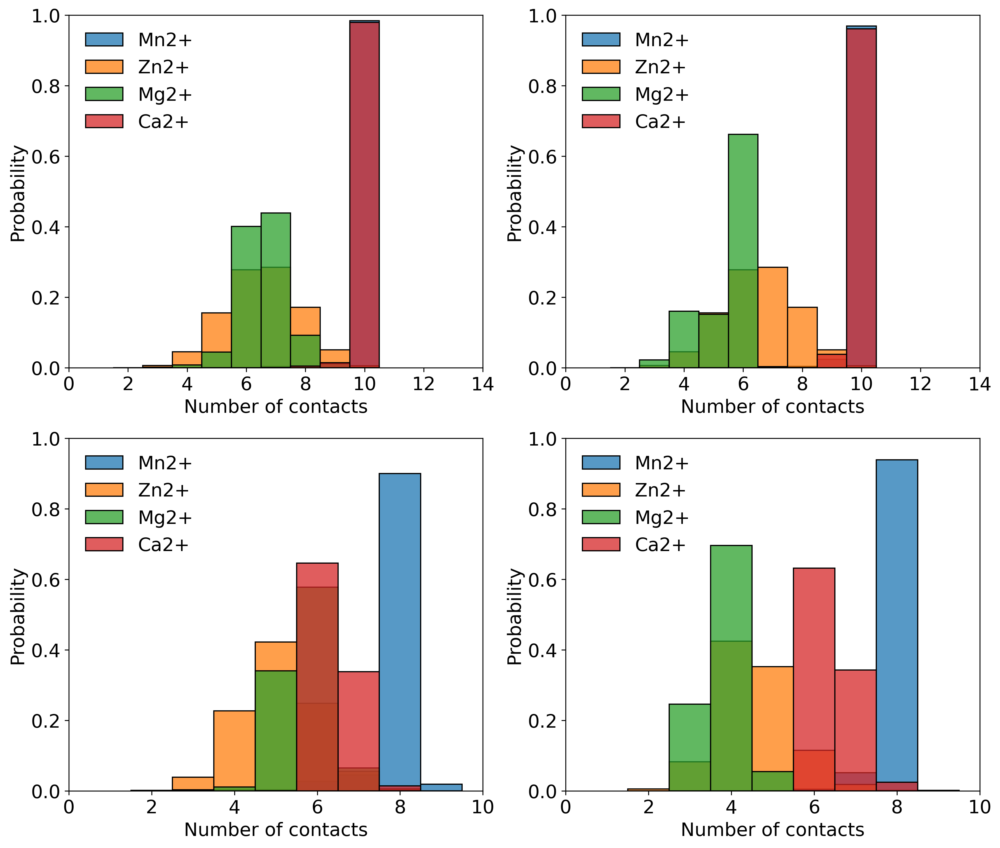

<Figure size 1920x1440 with 0 Axes>

In [34]:
# Plots 
# A figure with 3 panels: A) Time evol MPC comp. Metals. B) time evol MPC comp metals. C) MPC freq

plt.figure( figsize = (14,12))

# panel C --> MPC distplot

plt.subplot(221)
sns.histplot(data=Mn_PMC[:,1],stat='probability',discrete=True,label='Mn2+',element='bars', color='tab:blue')
sns.histplot(data=Zn_PMC[:,1],stat='probability',discrete=True,label='Zn2+',element='bars', color='tab:orange')
sns.histplot(data=Mg_PMC[:,1],stat='probability',discrete=True,label='Mg2+',element='bars', color='tab:green')
sns.histplot(data=Ca_PMC[:,1],stat='probability',discrete=True,label='Ca2+',element='bars', color='tab:red')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 14])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(222)
sns.histplot(data=Mn_PMC[:,2],stat='probability',discrete=True,label='Mn2+',element='bars', color='tab:blue')
sns.histplot(data=Zn_PMC[:,2],stat='probability',discrete=True,label='Zn2+',element='bars', color='tab:orange')
sns.histplot(data=Mg_PMC[:,2],stat='probability',discrete=True,label='Mg2+',element='bars', color='tab:green')
sns.histplot(data=Ca_PMC[:,2],stat='probability',discrete=True,label='Ca2+',element='bars', color='tab:red')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 14])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(223)
sns.histplot(data=Mn_MPC[:,1],stat='probability',discrete=True,label='Mn2+',element='bars', color='tab:blue')
sns.histplot(data=Zn_MPC[:,1],stat='probability',discrete=True,label='Zn2+',element='bars', color='tab:orange')
sns.histplot(data=Mg_MPC[:,1],stat='probability',discrete=True,label='Mg2+',element='bars', color='tab:green')
sns.histplot(data=Ca_MPC[:,1],stat='probability',discrete=True,label='Ca2+',element='bars', color='tab:red')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 10])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(224)
sns.histplot(data=Mn_MPC[:,2],stat='probability',discrete=True, label='Mn2+',element='bars', color='tab:blue')
sns.histplot(data=Zn_MPC[:,2],stat='probability',discrete=True, label='Zn2+',element='bars', color='tab:orange')
sns.histplot(data=Mg_MPC[:,2],stat='probability',discrete=True, label='Mg2+',element='bars', color='tab:green')
sns.histplot(data=Ca_MPC[:,2],stat='probability',discrete=True, label='Ca2+',element='bars', color='tab:red')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 10])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_MPC_PMC_PD_ASP_Nov2022.pdf',dpi=300, format = 'pdf')

plt.show()
plt.tight_layout()

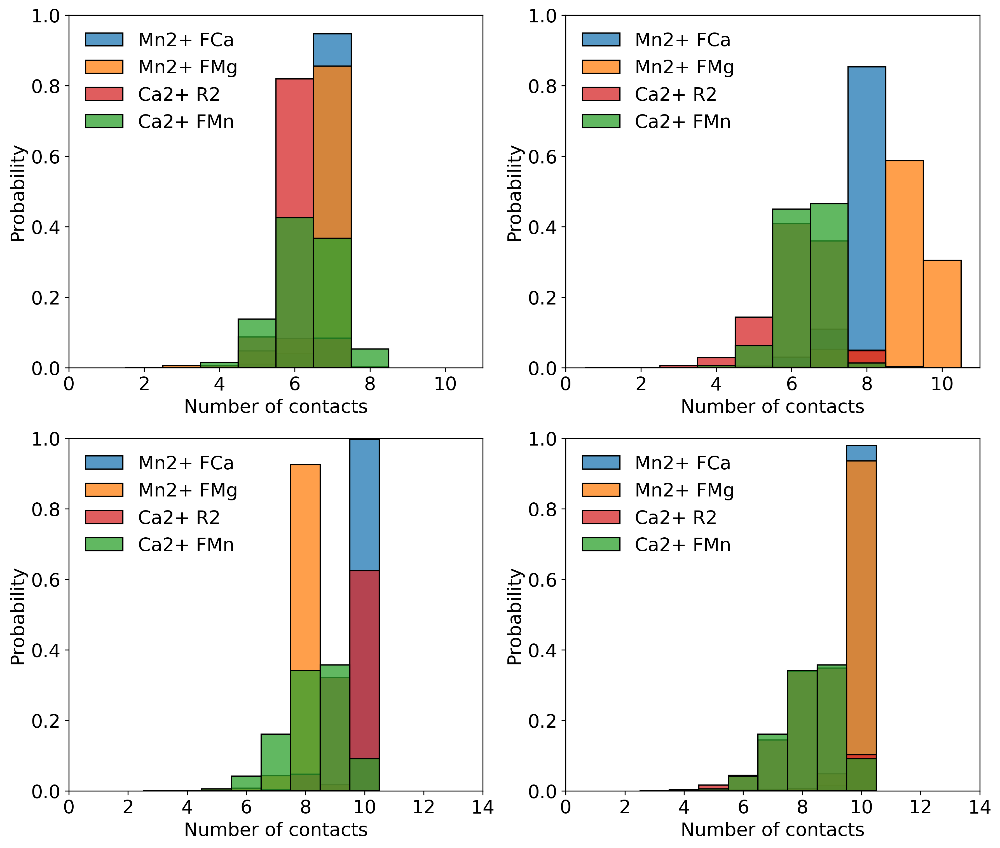

<Figure size 1920x1440 with 0 Axes>

In [4]:
plt.figure( figsize = (14,12))

# panel C --> MPC distplot

plt.subplot(221)
sns.histplot(data=mnFca_MPC[:,1],stat='probability',discrete=True,label='Mn2+ FCa',element='bars', color='tab:blue')
sns.histplot(data=mnFmg_MPC[:,1],stat='probability',discrete=True,label='Mn2+ FMg',element='bars', color='tab:orange')
sns.histplot(data=caR2_MPC[:,1],stat='probability',discrete=True,label='Ca2+ R2',element='bars', color='tab:red')
sns.histplot(data=CaFMn_MPC[:,1],stat='probability',discrete=True,label='Ca2+ FMn',element='bars', color='tab:green')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 11])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(222)
sns.histplot(data=mnFca_MPC[:,2],stat='probability',discrete=True,label= 'Mn2+ FCa',element='bars', color='tab:blue')
sns.histplot(data=mnFmg_MPC[:,2],stat='probability',discrete=True,label= 'Mn2+ FMg',element='bars', color='tab:orange')
sns.histplot(data=caR2_MPC[:,2],stat='probability',discrete=True,label=  'Ca2+ R2',element='bars', color='tab:red')
sns.histplot(data=CaFMn_MPC[:,2],stat='probability',discrete=True,label='Ca2+ FMn',element='bars', color='tab:green')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 11])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(223)
sns.histplot(data=mnFca_PMC[:,1],stat='probability',discrete=True,label='Mn2+ FCa',element='bars', color='tab:blue')
sns.histplot(data=mnFmg_PMC[:,1],stat='probability',discrete=True,label='Mn2+ FMg',element='bars', color='tab:orange')
sns.histplot(data=caR2_PMC[:,1],stat='probability',discrete=True,label='Ca2+ R2',element='bars', color='tab:red')
sns.histplot(data=CaFMn_PMC[:,1],stat='probability',discrete=True,label='Ca2+ FMn',element='bars', color='tab:green')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 14])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.subplot(224)
sns.histplot(data=mnFca_PMC[:,2],stat='probability',discrete=True,label= 'Mn2+ FCa',element='bars', color='tab:blue')
sns.histplot(data=mnFmg_PMC[:,2],stat='probability',discrete=True,label= 'Mn2+ FMg',element='bars', color='tab:orange')
sns.histplot(data=caR2_PMC[:,2],stat='probability',discrete=True,label=  'Ca2+ R2',element='bars', color='tab:red')
sns.histplot(data=CaFMn_PMC[:,1],stat='probability',discrete=True,label='Ca2+ FMn',element='bars', color='tab:green')
plt.legend(loc='upper left', frameon = False,) 
plt.xlim([0, 14])
plt.ylim([0, 1])
plt.xlabel('Number of contacts')

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_MPC_PMC_PD_continuaciones_ASP_Nov2022.pdf',dpi=300, format = 'pdf')

plt.show()
plt.tight_layout()

## Metal-protein contact analysis per "leaf" 

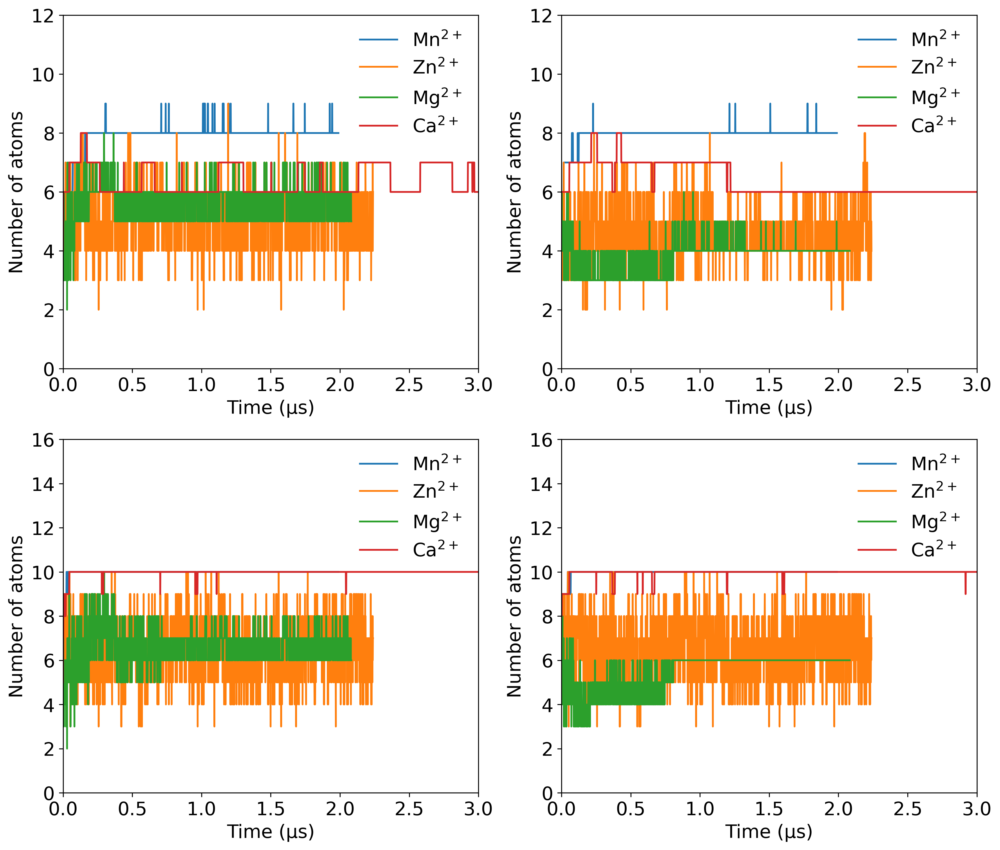

<Figure size 1920x1440 with 0 Axes>

In [5]:
# Plots 
# A figure with 3 panels: A) Time evol MPC comp. Metals. B) time evol PMC comp metals. C) PMC freq

plt.figure( figsize = (14,12))
# panel A time evolution of number of metal ions per "leaf" of the zipper.

maMn=Mn_MPC[0::10]
maZn=Zn_MPC[0::10]
maMg=Mg_MPC[0::10]
maCa=Ca_MPC[0::10]

macaR2 =caR2_MPC[0::10]   
mamnFca=mnFca_MPC[0::10]
mamnFmg=mnFmg_MPC[0::10]
maCaFMn_MPC=CaFMn_MPC[0::10]

maMn_pmc=Mn_PMC[0::10]
maZn_pmc=Zn_PMC[0::10]
maMg_pmc=Mg_PMC[0::10]
maCa_pmc=Ca_PMC[0::10]

macaR2_pmc=caR2_PMC[0::10] 
mamnFca_pmc=mnFca_PMC[0::10]
mamnFmg_pmc=mnFmg_PMC[0::10]
maCaFMn_PMC=CaFMn_PMC[0::10]
#print (maMn.shape)

plt.subplot(221)
plt.plot(maMn[:,0]/10000,maMn[:,1],label='Mn$^{2+}$',lw=1.5)
plt.plot(maZn[:,0]/10000,maZn[:,1],label='Zn$^{2+}$',lw=1.5)
plt.plot(maMg[:,0]/10000,maMg[:,1],label='Mg$^{2+}$',lw=1.5)
plt.plot(maCa[:,0]/10000,maCa[:,1],label='Ca$^{2+}$',lw=1.5)
#plt.plot(macaR2 [:,0]/10000,macaR2 [:,1],label='Ca$^{2+}$ R2',lw=1.5)
#plt.plot(mamnFca[:,0]/10000,mamnFca[:,1],label='Mn$^{2+}$ FCa',lw=1.5)
#plt.plot(mamnFmg[:,0]/10000,mamnFmg[:,1],label='Mn$^{2+}$ Fmg',lw=2.5)


plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 
plt.ylim([0, 12])
plt.xlim([0, 3.0])

plt.subplot(222)
plt.plot(maMn[:,0]/10000,maMn[:,2],label='Mn$^{2+}$',lw=1.5)
plt.plot(maZn[:,0]/10000,maZn[:,2],label='Zn$^{2+}$',lw=1.5)
plt.plot(maMg[:,0]/10000,maMg[:,2],label='Mg$^{2+}$',lw=1.5)
plt.plot(maCa[:,0]/10000,maCa[:,2],label='Ca$^{2+}$',lw=1.5)
plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 

plt.ylim([0, 12])
plt.xlim([0, 3.0])

plt.subplot(223)
plt.plot(maMn_pmc[:,0]/10000,maMn_pmc[:,1],label='Mn$^{2+}$',lw=1.5)
plt.plot(maZn_pmc[:,0]/10000,maZn_pmc[:,1],label='Zn$^{2+}$',lw=1.5)
plt.plot(maMg_pmc[:,0]/10000,maMg_pmc[:,1],label='Mg$^{2+}$',lw=1.5)
plt.plot(maCa_pmc[:,0]/10000,maCa_pmc[:,1],label='Ca$^{2+}$',lw=1.5)
plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 
plt.ylim([0, 16])
plt.xlim([0, 3.0])

plt.subplot(224)
plt.plot(maMn_pmc[:,0]/10000,maMn_pmc[:,2],label='Mn$^{2+}$',lw=1.5)
plt.plot(maZn_pmc[:,0]/10000,maZn_pmc[:,2],label='Zn$^{2+}$',lw=1.5)
plt.plot(maMg_pmc[:,0]/10000,maMg_pmc[:,2],label='Mg$^{2+}$',lw=1.5)
plt.plot(maCa_pmc[:,0]/10000,maCa_pmc[:,2],label='Ca$^{2+}$',lw=1.5)
plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 

plt.ylim([0, 16])
plt.xlim([0, 3.0])

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_ions_Leaf_ASP_Nov2022.pdf',dpi=300, format = 'pdf')

plt.show()
plt.tight_layout()



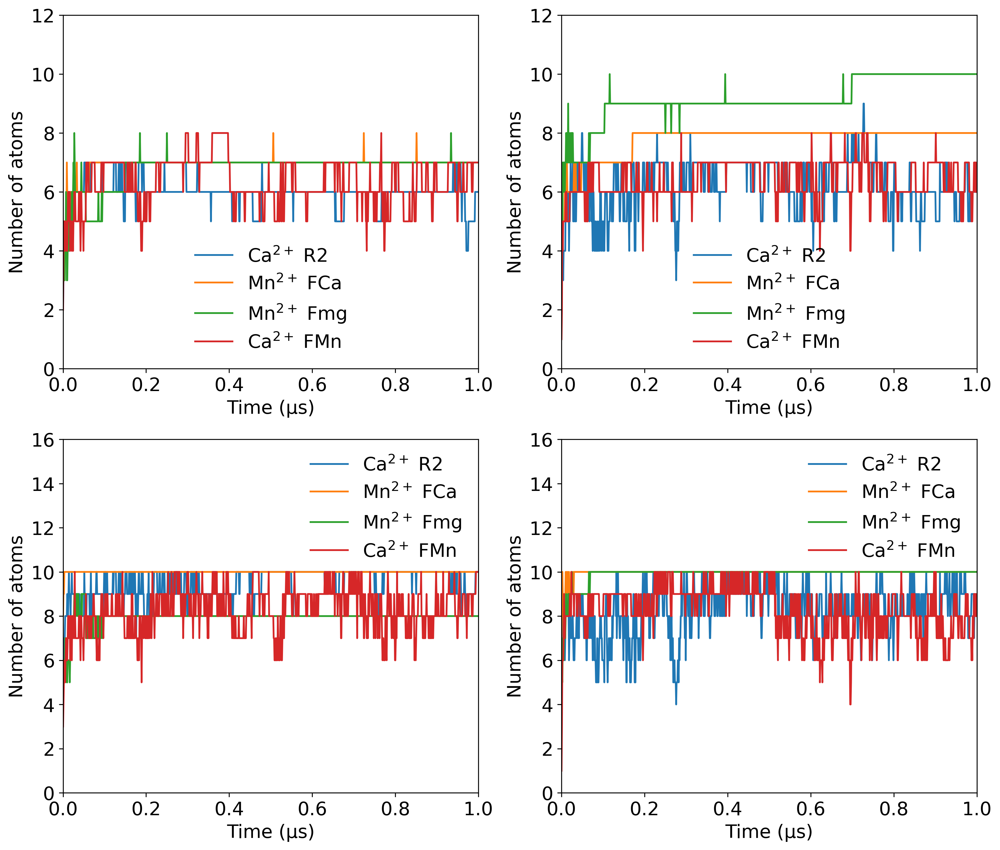

<Figure size 1920x1440 with 0 Axes>

In [6]:
# Plots 
# A figure with 3 panels: A) Time evol MPC comp. Metals. B) time evol PMC comp metals. C) PMC freq

plt.figure( figsize = (14,12))
# panel A time evolution of number of metal ions per "leaf" of the zipper.



macaR2 =caR2_MPC[0::10]   
mamnFca=mnFca_MPC[0::10]
mamnFmg=mnFmg_MPC[0::10]

macaR2_pmc=caR2_PMC[0::10] 
mamnFca_pmc=mnFca_PMC[0::10]
mamnFmg_pmc=mnFmg_PMC[0::10]

maCaFMn_MPC=CaFMn_MPC[0::10]
maCaFMn_PMC=CaFMn_PMC[0::10]
#print (maMn.shape)

plt.subplot(221)
plt.plot(macaR2 [:,0]/10000,macaR2 [:,1],label='Ca$^{2+}$ R2',lw=1.5)
plt.plot(mamnFca[:,0]/10000,mamnFca[:,1],label='Mn$^{2+}$ FCa',lw=1.5)
plt.plot(mamnFmg[:,0]/10000,mamnFmg[:,1],label='Mn$^{2+}$ Fmg',lw=1.5)
plt.plot(maCaFMn_MPC[:,0]/10000,maCaFMn_MPC[:,1],label='Ca$^{2+}$ FMn',lw=1.5)

plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 
plt.ylim([0, 12])
plt.xlim([0, 1.0])

plt.subplot(222)
plt.plot(macaR2 [:,0]/10000,macaR2 [:,2],label='Ca$^{2+}$ R2',lw=1.5)
plt.plot(mamnFca[:,0]/10000,mamnFca[:,2],label='Mn$^{2+}$ FCa',lw=1.5)
plt.plot(mamnFmg[:,0]/10000,mamnFmg[:,2],label='Mn$^{2+}$ Fmg',lw=1.5)
plt.plot(maCaFMn_MPC[:,0]/10000,maCaFMn_MPC[:,2],label='Ca$^{2+}$ FMn',lw=1.5)

plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 

plt.ylim([0, 12])
plt.xlim([0, 1.0])

plt.subplot(223)
plt.plot(macaR2_pmc [:,0]/10000,macaR2_pmc [:,1],label='Ca$^{2+}$ R2',lw=1.5)
plt.plot(mamnFca_pmc[:,0]/10000,mamnFca_pmc[:,1],label='Mn$^{2+}$ FCa',lw=1.5)
plt.plot(mamnFmg_pmc[:,0]/10000,mamnFmg_pmc[:,1],label='Mn$^{2+}$ Fmg',lw=1.5)
plt.plot(maCaFMn_PMC[:,0]/10000,maCaFMn_PMC[:,1],label='Ca$^{2+}$ FMn',lw=1.5)
plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 
plt.ylim([0, 16])
plt.xlim([0, 1.0])

plt.subplot(224)
plt.plot(macaR2_pmc [:,0]/10000,macaR2_pmc [:,2],label='Ca$^{2+}$ R2',lw=1.5)
plt.plot(mamnFca_pmc[:,0]/10000,mamnFca_pmc[:,2],label='Mn$^{2+}$ FCa',lw=1.5)
plt.plot(mamnFmg_pmc[:,0]/10000,mamnFmg_pmc[:,2],label='Mn$^{2+}$ Fmg',lw=1.5)
plt.plot(maCaFMn_PMC[:,0]/10000,maCaFMn_PMC[:,2],label='Ca$^{2+}$ FMn',lw=1.5)
plt.xlabel('Time (µs)')
plt.ylabel('Number of atoms')
plt.legend(loc='best', frameon = False,) 

plt.ylim([0, 16])
plt.xlim([0, 1.0])

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_ions_Leaf_continuaciones_ASP_Nov2022.pdf',dpi=300, format = 'pdf')

plt.show()
plt.tight_layout()

In [7]:
## Mean and STD of metal protein contacts

mna_avg=np.mean(Mn_MPC[:,1])
mnb_avg=np.mean(Mn_MPC[:,2])

zna_avg=np.mean(Zn_MPC[:,1])
znb_avg=np.mean(Zn_MPC[:,2])

mga_avg=np.mean(Mg_MPC[:,1])
mgb_avg=np.mean(Mg_MPC[:,2])

caa_avg=np.mean(Ca_MPC[:,1])
cab_avg=np.mean(Ca_MPC[:,2])

mna_std=np.std(Mn_MPC[:,1])
mnb_std=np.std(Mn_MPC[:,2])

zna_std=np.std(Zn_MPC[:,1])
znb_std=np.std(Zn_MPC[:,2])

mga_std=np.std(Mg_MPC[:,1])
mgb_std=np.std(Mg_MPC[:,2])

caa_std=np.std(Ca_MPC[:,1])
cab_std=np.std(Ca_MPC[:,2])

caaR2_avg=np.mean(caR2_MPC[:,1])
cabR2_avg=np.mean(caR2_MPC[:,2])

mnFcaa_avg=np.mean(mnFca_MPC[:,1])
mnFcab_avg=np.mean(mnFca_MPC[:,2])

mnFmga_avg=np.mean(mnFmg_MPC[:,1])
mnFmgb_avg=np.mean(mnFmg_MPC[:,2])

caaR2_std=np.std(caR2_MPC[:,1])
cabR2_std=np.std(caR2_MPC[:,2])

mnFcaa_std=np.std(mnFca_MPC[:,1])
mnFcab_std=np.std(mnFca_MPC[:,2])

mnFmga_std=np.std(mnFmg_MPC[:,1])
mnFmgb_std=np.std(mnFmg_MPC[:,2])

CaFMn_a_avg=np.mean(maCaFMn_MPC[:,1])
CaFMn_b_avg=np.mean(maCaFMn_MPC[:,2])

CaFMn_a_std=np.std(maCaFMn_MPC[:,1])
CaFMn_b_std=np.std(maCaFMn_MPC[:,2])


print ('MPC')
print ('Mn_A=', np.round(mna_avg,decimals=0), '±', np.round(mna_std,decimals=2))
print ('Mn_B=', np.round(mnb_avg,decimals=0), '±', np.round(mnb_std,decimals=2))

print ('Zn_A=', np.round(zna_avg,decimals=0), '±', np.round(zna_std,decimals=0))
print ('Zn_B=', np.round(znb_avg,decimals=0), '±', np.round(znb_std,decimals=0))

print ('Mg_A=', np.round(mga_avg,decimals=0), '±', np.round(mga_std,decimals=2))
print ('Mg_B=', np.round(mgb_avg,decimals=0), '±', np.round(mgb_std,decimals=2))

print ('Ca_A=', np.round(caa_avg,decimals=0), '±', np.round(caa_std,decimals=2))
print ('Ca_B=', np.round(cab_avg,decimals=0), '±', np.round(cab_std,decimals=2))

print ('Car2_A=', np.round(caaR2_avg,decimals=0), '±', np.round(caaR2_std,decimals=0))
print ('Car2_B=', np.round(cabR2_avg,decimals=0), '±', np.round(cabR2_std,decimals=0))

print ('MnFCa_A=', np.round(mnFcaa_avg,decimals=0), '±', np.round(mnFcaa_std,decimals=0))
print ('MnFCa_B=', np.round(mnFcab_avg,decimals=0), '±', np.round(mnFcab_std,decimals=0))

print ('mnFmg_A=', np.round(mnFmga_avg,decimals=0), '±', np.round(mnFmga_std,decimals=0))
print ('mnFmg_B=', np.round(mnFmgb_avg,decimals=0), '±', np.round(mnFmgb_std,decimals=0))

print ('CaFMn_A=', np.round(CaFMn_a_avg,decimals=0), '±', np.round(CaFMn_a_std,decimals=0))
print ('CaFMn_B=', np.round(CaFMn_b_avg,decimals=0), '±', np.round(CaFMn_b_std,decimals=0))

MPC
Mn_A= 8.0 ± 0.51
Mn_B= 8.0 ± 0.29
Zn_A= 5.0 ± 1.0
Zn_B= 5.0 ± 1.0
Mg_A= 6.0 ± 0.63
Mg_B= 4.0 ± 0.53
Ca_A= 6.0 ± 0.51
Ca_B= 6.0 ± 0.54
Car2_A= 6.0 ± 0.0
Car2_B= 6.0 ± 1.0
MnFCa_A= 7.0 ± 0.0
MnFCa_B= 8.0 ± 1.0
mnFmg_A= 7.0 ± 1.0
mnFmg_B= 9.0 ± 1.0
CaFMn_A= 6.0 ± 1.0
CaFMn_B= 6.0 ± 1.0


In [8]:
## Mean and STD of protein metal contacts

mna_avg=np.mean(Mn_PMC[:,1])
mnb_avg=np.mean(Mn_PMC[:,2])

zna_avg=np.mean(Zn_PMC[:,1])
znb_avg=np.mean(Zn_PMC[:,2])

mga_avg=np.mean(Mg_PMC[:,1])
mgb_avg=np.mean(Mg_PMC[:,2])

caa_avg=np.mean(Ca_PMC[:,1])
cab_avg=np.mean(Ca_PMC[:,2])

mna_std=np.std(Mn_PMC[:,1])
mnb_std=np.std(Mn_PMC[:,2])

zna_std=np.std(Zn_PMC[:,1])
znb_std=np.std(Zn_PMC[:,2])

mga_std=np.std(Mg_PMC[:,1])
mgb_std=np.std(Mg_PMC[:,2])

caa_std=np.std(Ca_PMC[:,1])
cab_std=np.std(Ca_PMC[:,2])

caaR2_avg=np.mean(caR2_PMC[:,1])
cabR2_avg=np.mean(caR2_PMC[:,2])

mnFcaa_avg=np.mean(mnFca_MPC[:,1])
mnFcab_avg=np.mean(mnFca_MPC[:,2])

mnFmga_avg=np.mean(mnFmg_MPC[:,1])
mnFmgb_avg=np.mean(mnFmg_MPC[:,2])

caaR2_std=np.std(caR2_PMC[:,1])
cabR2_std=np.std(caR2_PMC[:,2])

mnFcaa_std=np.std(mnFca_PMC[:,1])
mnFcab_std=np.std(mnFca_PMC[:,2])

mnFmga_std=np.std(mnFmg_PMC[:,1])
mnFmgb_std=np.std(mnFmg_PMC[:,2])

CaFMn_a_avg=np.mean(maCaFMn_PMC[:,1])
CaFMn_b_avg=np.mean(maCaFMn_PMC[:,2])
CaFMn_a_std=np.std(maCaFMn_PMC[:,1])
CaFMn_b_std=np.std(maCaFMn_PMC[:,2])


print ('PMC')
print ('Mn_A=', np.round(mna_avg,decimals=0), '±', np.round(mna_std,decimals=0))
print ('Mn_B=', np.round(mnb_avg,decimals=0), '±', np.round(mnb_std,decimals=0))

print ('Zn_A=', np.round(zna_avg,decimals=0), '±', np.round(zna_std,decimals=0))
print ('Zn_B=', np.round(znb_avg,decimals=0), '±', np.round(znb_std,decimals=0))

print ('Mg_A=', np.round(mga_avg,decimals=0), '±', np.round(mga_std,decimals=0))
print ('Mg_B=', np.round(mgb_avg,decimals=0), '±', np.round(mgb_std,decimals=0))

print ('Ca_A=', np.round(caa_avg,decimals=0), '±', np.round(caa_std,decimals=0))
print ('Ca_B=', np.round(cab_avg,decimals=0), '±', np.round(cab_std,decimals=0))

print ('Car2_A=', np.round(caaR2_avg,decimals=0), '±', np.round(caaR2_std,decimals=0))
print ('Car2_B=', np.round(cabR2_avg,decimals=0), '±', np.round(cabR2_std,decimals=0))

print ('MnFCa_A=', np.round(mnFcaa_avg,decimals=0), '±', np.round(mnFcaa_std,decimals=0))
print ('MnFCa_B=', np.round(mnFcab_avg,decimals=0), '±', np.round(mnFcab_std,decimals=0))

print ('mnFmg_A=', np.round(mnFmga_avg,decimals=0), '±', np.round(mnFmga_std,decimals=0))
print ('mnFmg_B=', np.round(mnFmgb_avg,decimals=0), '±', np.round(mnFmgb_std,decimals=0))

print ('CaFMn_A=', np.round(CaFMn_a_avg,decimals=0), '±', np.round(CaFMn_a_std,decimals=0))
print ('CaFMn_B=', np.round(CaFMn_b_avg,decimals=0), '±', np.round(CaFMn_b_std,decimals=0))

PMC
Mn_A= 10.0 ± 0.0
Mn_B= 10.0 ± 0.0
Zn_A= 7.0 ± 1.0
Zn_B= 7.0 ± 1.0
Mg_A= 7.0 ± 1.0
Mg_B= 5.0 ± 1.0
Ca_A= 10.0 ± 0.0
Ca_B= 10.0 ± 0.0
Car2_A= 10.0 ± 1.0
Car2_B= 8.0 ± 1.0
MnFCa_A= 7.0 ± 0.0
MnFCa_B= 8.0 ± 0.0
mnFmg_A= 7.0 ± 0.0
mnFmg_B= 9.0 ± 0.0
CaFMn_A= 8.0 ± 1.0
CaFMn_B= 8.0 ± 1.0


## RMSD 

In [9]:
#Load files
Mn_rmsdc = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mn_rmsd_Ca_1_8.dat')
Zn_rmsdc = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Zn_rmsd_Ca_1_9.dat')
Mg_rmsdc = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mg_rmsd_Mg_1_9.dat')
Ca_rmsdc = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Ca_rmsd_Ca_1_13.dat')

ca_r2_rmsdc =np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/ca_r2_after3us_rmsd_1us.dat')
mn_Fca_rmsdc=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_ca3us_rmsd_1us.dat')
mn_Fmg_rmsdc=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_Mg_rmsd_1us.dat')
Ca_FMn_rmsdc=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Ca_from_Mn_rmsd_1us.dat')




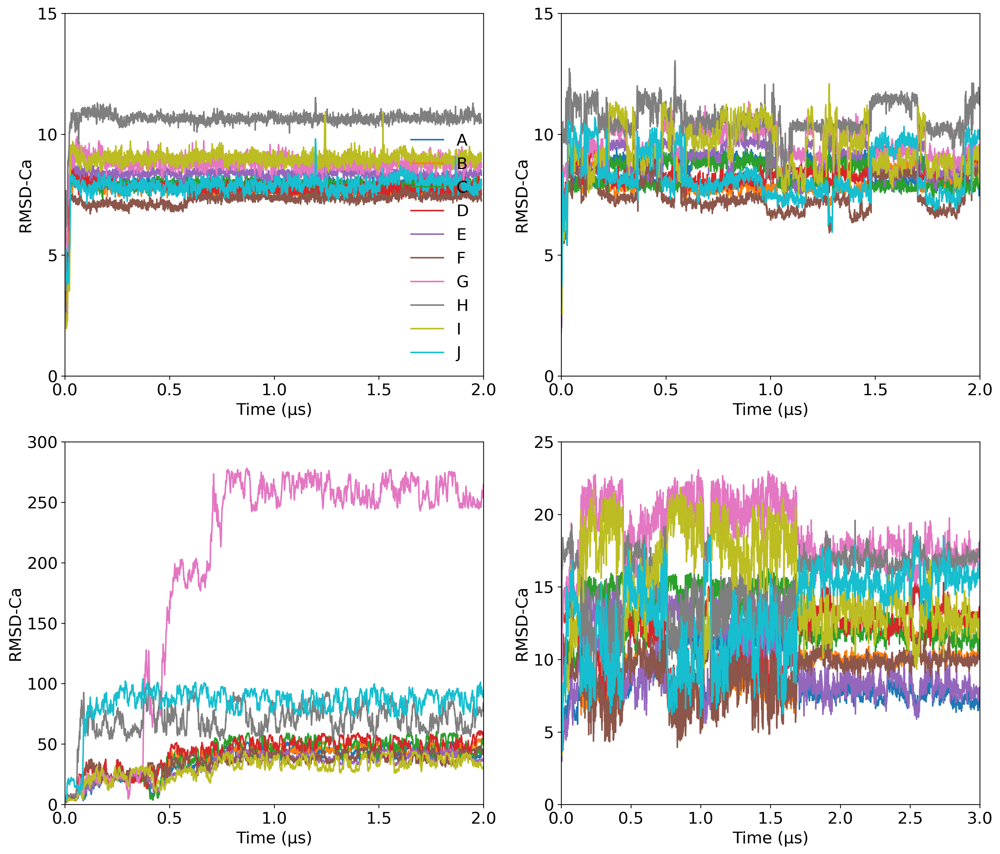

In [77]:
# Figures 


# Overall RMSD Ca of the amyloid

#plt.figure( figsize = (18,6))

# panel A

#plt.subplot(231)
#plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,1],label='Mn2+')
##plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,1],label='Zn2+')
#plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,1],label='Mg2+')
#plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,1],label='Ca2+')
#plt.xlabel('Time (µs)')
#plt.ylabel('RMSD-Ca')
#plt.legend(loc='upper left', frameon = False,) 
##plt.title(str(fname))
##plt.ylim([0, 15])
##plt.xlim([0, 1.25])

## MAvg

Mn_rmsd=bn.move_mean(Mn_rmsdc, window=10,axis=0)
Zn_rmsd=bn.move_mean(Zn_rmsdc, window=10,axis=0)
Mg_rmsd=bn.move_mean(Mg_rmsdc, window=10,axis=0)
Ca_rmsd=bn.move_mean(Ca_rmsdc, window=10,axis=0)

#Mn_rmsd=Mn_rmsdc[0::5]
#Zn_rmsd=Zn_rmsdc[0::5]
#Mg_rmsd=Mg_rmsdc[0::5]
#Ca_rmsd=Ca_rmsdc[0::5]

plt.figure( figsize = (14,12))

# Per chain RMSD Ca 
#Mn
plt.subplot(221)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,2],label='A',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,3],label='B',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,4],label='C',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,5],label='D',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,6],label='E',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,7],label='F',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,8],label='G',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,9],label='H',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,10],label='I',rasterized=True)
plt.plot((Mn_rmsd[:,0]/10000),Mn_rmsd[:,11],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 15])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2.1, step=0.5))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 16, step=5))  # Set label locations.
#Zn
plt.subplot(222)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,2],label='A',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,3],label='B',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,4],label='C',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,5],label='D',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,6],label='E',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,7],label='F',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,8],label='G',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,9],label='H',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,10],label='I',rasterized=True)
plt.plot((Zn_rmsd[:,0]/10000),Zn_rmsd[:,11],label='J',rasterized=True)
##plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
##plt.title(str(fname))
plt.ylim([0, 15])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2.1, step=0.5))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 16, step=5))  # Set label locations.
#Mg
plt.subplot(223)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,2],label='A',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,3],label='B',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,4],label='C',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,5],label='D',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,6],label='E',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,7],label='F',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,8],label='G',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,9],label='H',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,10],label='I',rasterized=True)
plt.plot((Mg_rmsd[:,0]/10000),Mg_rmsd[:,11],label='J',rasterized=True)
#plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 300])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2.1, step=0.5))  # Set label locations.

#Ca
plt.subplot(224)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,2],label='A',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,3],label='B',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,4],label='C',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,5],label='D',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,6],label='E',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,7],label='F',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,8],label='G',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,9],label='H',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,10],label='I',rasterized=True)
plt.plot((Ca_rmsd[:,0]/10000),Ca_rmsd[:,11],label='J',rasterized=True)
##plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
##plt.title(str(fname))
plt.ylim([0, 25])
plt.xlim([0, 3.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 3.1, step=0.5))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 26, step=5))  # Set label locations.

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSD_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

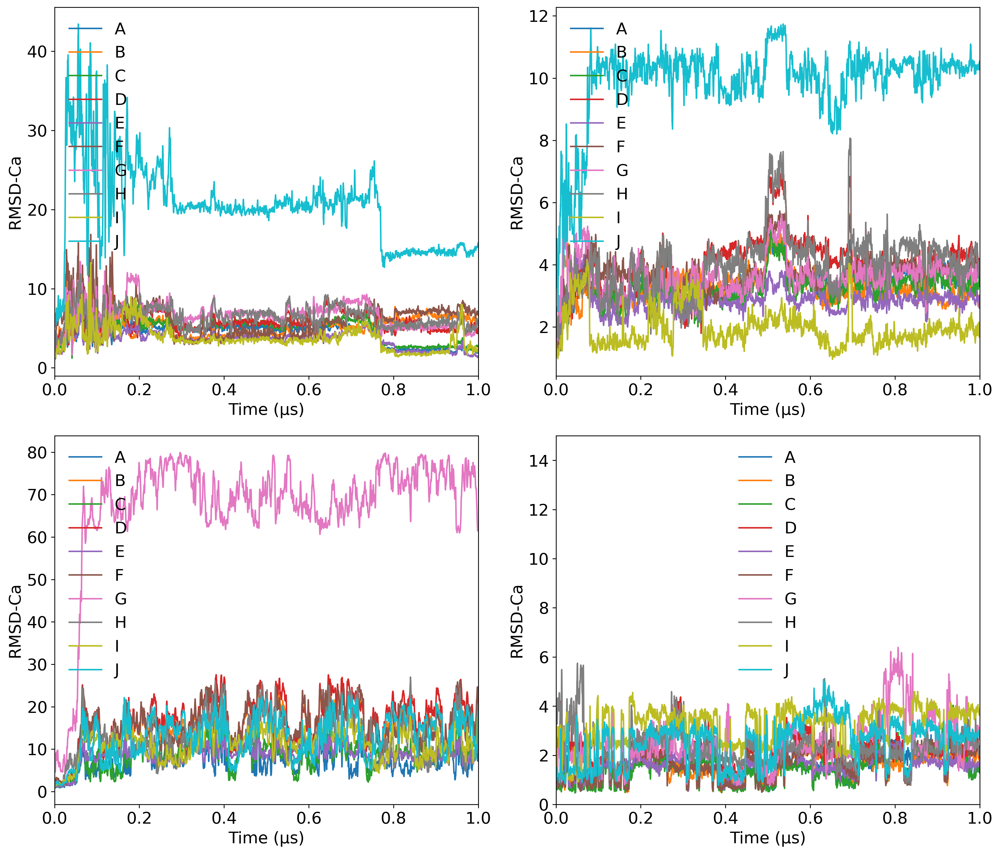

In [11]:
# Overall RMSD Ca of the amyloid --- continuations



## MAvg

ca_r2_rmsd=bn.move_mean(ca_r2_rmsdc , window=10,axis=0)
mn_Fca_rmsd=bn.move_mean(mn_Fca_rmsdc, window=10,axis=0)
mn_Fmg_rmsd=bn.move_mean(mn_Fmg_rmsdc, window=10,axis=0)
Ca_FMn_rmsd=bn.move_mean(Ca_FMn_rmsdc, window=10,axis=0)


plt.figure( figsize = (14,12))

# Per chain RMSD Ca 

#Ca_r3_after_3us_Ca
plt.subplot(221)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,2],label='A',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,3],label='B',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,4],label='C',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,5],label='D',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,6],label='E',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,7],label='F',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,8],label='G',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,9],label='H',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,10],label='I',rasterized=True)
plt.plot((ca_r2_rmsd[:,0]/10000),ca_r2_rmsd[:,11],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
#plt.ylim([0, 15])
plt.xlim([0, 1.0])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Mn_from_3usCa
plt.subplot(222)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,2],label='A',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,3],label='B',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,4],label='C',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,5],label='D',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,6],label='E',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,7],label='F',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,8],label='G',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,9],label='H',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,10],label='I',rasterized=True)
plt.plot((mn_Fca_rmsd[:,0]/10000),mn_Fca_rmsd[:,11],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
#plt.ylim([0, 15])
plt.xlim([0, 1.0])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Mn_from_Mg
plt.subplot(223)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,2],label='A',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,3],label='B',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,4],label='C',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,5],label='D',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,6],label='E',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,7],label='F',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,8],label='G',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,9],label='H',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,10],label='I',rasterized=True)
plt.plot((mn_Fmg_rmsd[:,0]/10000),mn_Fmg_rmsd[:,11],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
#plt.ylim([0, 15])
plt.xlim([0, 1.0])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Ca_after_Mn
plt.subplot(224)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,2],label='A',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,3],label='B',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,4],label='C',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,5],label='D',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,6],label='E',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,7],label='F',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,8],label='G',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,9],label='H',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,10],label='I',rasterized=True)
plt.plot((Ca_FMn_rmsd[:,0]/10000),Ca_FMn_rmsd[:,11],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 15])
plt.xlim([0, 1.0])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.



plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSD_cont_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

In [79]:
#Load files
Mn_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mn_rmsf_Ca_1_8.dat')
Zn_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Zn_rmsf_Ca_1_9.dat')
Mg_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mg_rmsf_Mg_1_9.dat')
Ca_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Ca_rmsf_Ca_1_13.dat')

Mn_rmsf.shape

(10, 7)

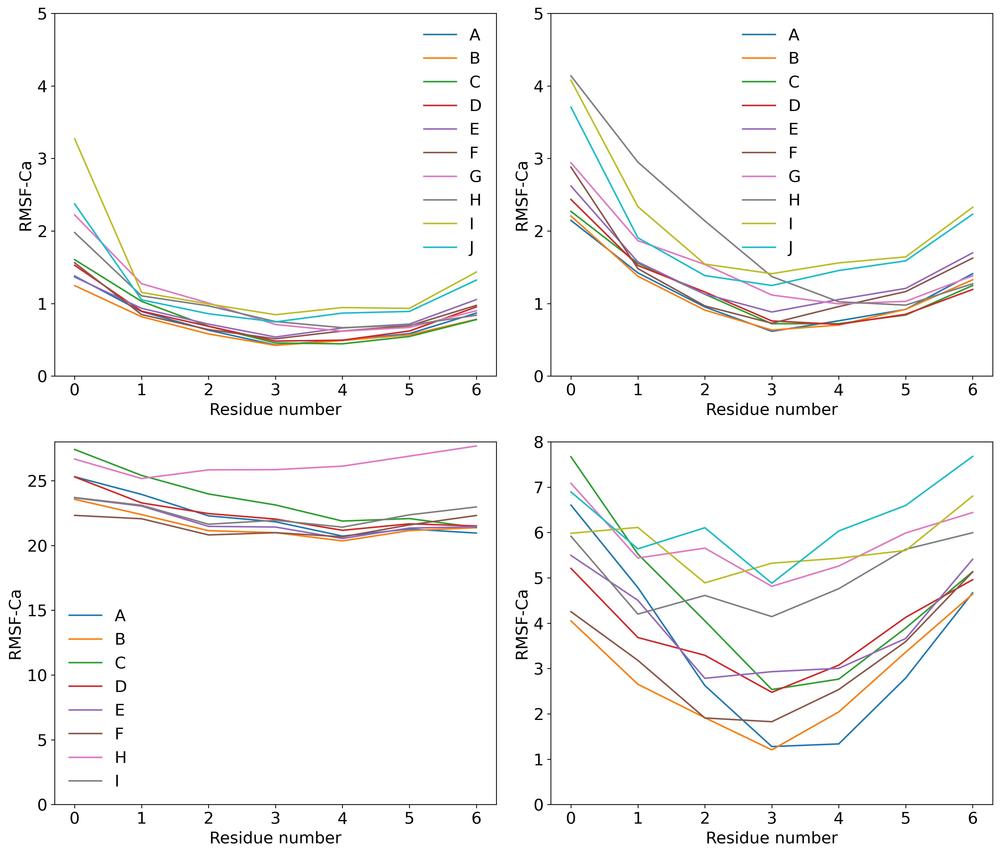

In [84]:
plt.figure( figsize = (14,12))

# Per chain RMSD Ca 
#Mn
plt.subplot(221)
plt.plot((Mn_rmsf[0,:]),label='A',rasterized=True)
plt.plot((Mn_rmsf[1,:]),label='B',rasterized=True)
plt.plot((Mn_rmsf[2,:]),label='C',rasterized=True)
plt.plot((Mn_rmsf[3,:]),label='D',rasterized=True)
plt.plot((Mn_rmsf[4,:]),label='E',rasterized=True)
plt.plot((Mn_rmsf[5,:]),label='F',rasterized=True)
plt.plot((Mn_rmsf[6,:]),label='G',rasterized=True)
plt.plot((Mn_rmsf[7,:]),label='H',rasterized=True)
plt.plot((Mn_rmsf[8,:]),label='I',rasterized=True)
plt.plot((Mn_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 5.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.subplot(222)
plt.plot((Zn_rmsf[0,:]),label='A',rasterized=True)
plt.plot((Zn_rmsf[1,:]),label='B',rasterized=True)
plt.plot((Zn_rmsf[2,:]),label='C',rasterized=True)
plt.plot((Zn_rmsf[3,:]),label='D',rasterized=True)
plt.plot((Zn_rmsf[4,:]),label='E',rasterized=True)
plt.plot((Zn_rmsf[5,:]),label='F',rasterized=True)
plt.plot((Zn_rmsf[6,:]),label='G',rasterized=True)
plt.plot((Zn_rmsf[7,:]),label='H',rasterized=True)
plt.plot((Zn_rmsf[8,:]),label='I',rasterized=True)
plt.plot((Zn_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 5.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.subplot(223)
plt.plot((Mg_rmsf[0,:]),label='A',rasterized=True)
plt.plot((Mg_rmsf[1,:]),label='B',rasterized=True)
plt.plot((Mg_rmsf[2,:]),label='C',rasterized=True)
plt.plot((Mg_rmsf[3,:]),label='D',rasterized=True)
plt.plot((Mg_rmsf[4,:]),label='E',rasterized=True)
plt.plot((Mg_rmsf[5,:]),label='F',rasterized=True)
#plt.plot((Mg_rmsf[6,:]),label='G',rasterized=True)
plt.plot((Mg_rmsf[7,:]),label='H',rasterized=True)
plt.plot((Mg_rmsf[8,:]),label='I',rasterized=True)
#plt.plot((Mg_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 28.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.subplot(224)
plt.plot((Ca_rmsf[0,:]),label='A',rasterized=True)
plt.plot((Ca_rmsf[1,:]),label='B',rasterized=True)
plt.plot((Ca_rmsf[2,:]),label='C',rasterized=True)
plt.plot((Ca_rmsf[3,:]),label='D',rasterized=True)
plt.plot((Ca_rmsf[4,:]),label='E',rasterized=True)
plt.plot((Ca_rmsf[5,:]),label='F',rasterized=True)
plt.plot((Ca_rmsf[6,:]),label='G',rasterized=True)
plt.plot((Ca_rmsf[7,:]),label='H',rasterized=True)
plt.plot((Ca_rmsf[8,:]),label='I',rasterized=True)
plt.plot((Ca_rmsf[9,:]),label='J',rasterized=True)
#plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 8.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSF_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

In [12]:
#Load files
Car2_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/ca_r2_after3us_rmsf_1us.dat')
MnFCa_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_ca3us_rmsf_1us.dat')
MnFMg_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_Mg_rmsf_1us.dat')
CaFMn_rmsf = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Ca_from_Mn_rmsf_1us.dat')



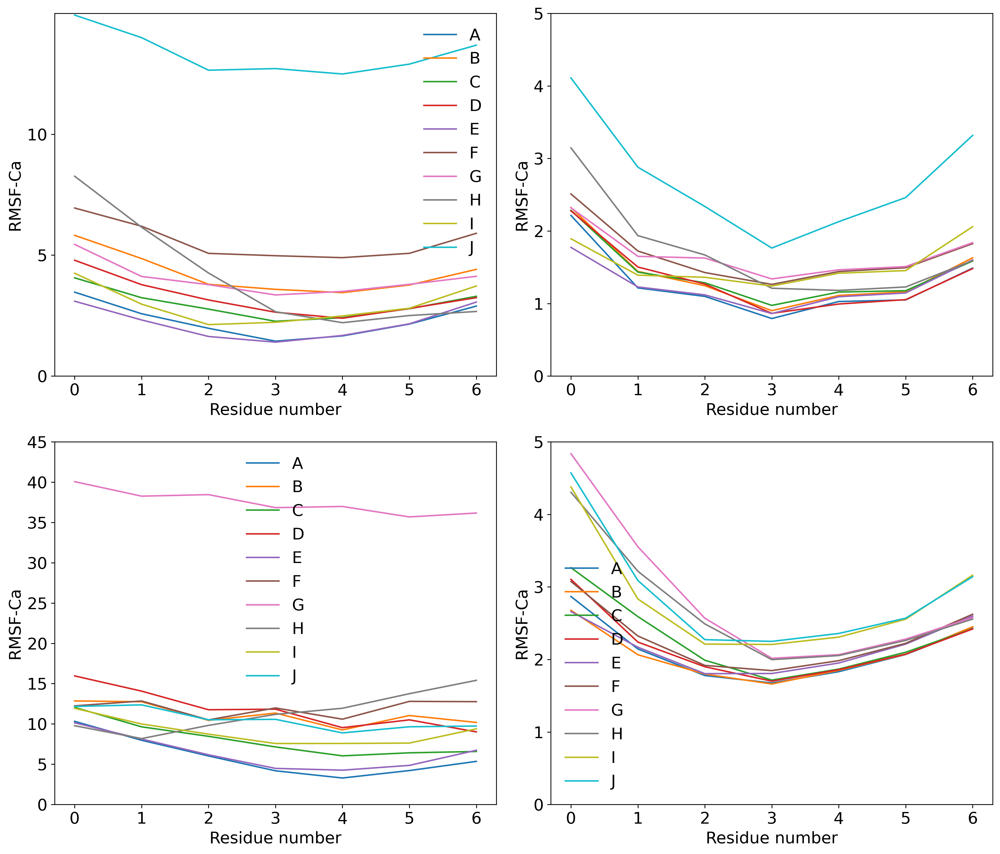

In [16]:
plt.figure( figsize = (14,12))

# Per chain RMSD Ca 
#Mn
plt.subplot(221)
plt.plot((Car2_rmsf[0,:]),label='A',rasterized=True)
plt.plot((Car2_rmsf[1,:]),label='B',rasterized=True)
plt.plot((Car2_rmsf[2,:]),label='C',rasterized=True)
plt.plot((Car2_rmsf[3,:]),label='D',rasterized=True)
plt.plot((Car2_rmsf[4,:]),label='E',rasterized=True)
plt.plot((Car2_rmsf[5,:]),label='F',rasterized=True)
plt.plot((Car2_rmsf[6,:]),label='G',rasterized=True)
plt.plot((Car2_rmsf[7,:]),label='H',rasterized=True)
plt.plot((Car2_rmsf[8,:]),label='I',rasterized=True)
plt.plot((Car2_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 15.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 15.0, step=5))  # Set label locations.

plt.subplot(222)
plt.plot((MnFCa_rmsf[0,:]),label='A',rasterized=True)
plt.plot((MnFCa_rmsf[1,:]),label='B',rasterized=True)
plt.plot((MnFCa_rmsf[2,:]),label='C',rasterized=True)
plt.plot((MnFCa_rmsf[3,:]),label='D',rasterized=True)
plt.plot((MnFCa_rmsf[4,:]),label='E',rasterized=True)
plt.plot((MnFCa_rmsf[5,:]),label='F',rasterized=True)
plt.plot((MnFCa_rmsf[6,:]),label='G',rasterized=True)
plt.plot((MnFCa_rmsf[7,:]),label='H',rasterized=True)
plt.plot((MnFCa_rmsf[8,:]),label='I',rasterized=True)
plt.plot((MnFCa_rmsf[9,:]),label='J',rasterized=True)
#plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 5.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.subplot(223)
plt.plot((MnFMg_rmsf[0,:]),label='A',rasterized=True)
plt.plot((MnFMg_rmsf[1,:]),label='B',rasterized=True)
plt.plot((MnFMg_rmsf[2,:]),label='C',rasterized=True)
plt.plot((MnFMg_rmsf[3,:]),label='D',rasterized=True)
plt.plot((MnFMg_rmsf[4,:]),label='E',rasterized=True)
plt.plot((MnFMg_rmsf[5,:]),label='F',rasterized=True)
plt.plot((MnFMg_rmsf[6,:]),label='G',rasterized=True)
plt.plot((MnFMg_rmsf[7,:]),label='H',rasterized=True)
plt.plot((MnFMg_rmsf[8,:]),label='I',rasterized=True)
plt.plot((MnFMg_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 45.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.subplot(224)
plt.plot((CaFMn_rmsf[0,:]),label='A',rasterized=True)
plt.plot((CaFMn_rmsf[1,:]),label='B',rasterized=True)
plt.plot((CaFMn_rmsf[2,:]),label='C',rasterized=True)
plt.plot((CaFMn_rmsf[3,:]),label='D',rasterized=True)
plt.plot((CaFMn_rmsf[4,:]),label='E',rasterized=True)
plt.plot((CaFMn_rmsf[5,:]),label='F',rasterized=True)
plt.plot((CaFMn_rmsf[6,:]),label='G',rasterized=True)
plt.plot((CaFMn_rmsf[7,:]),label='H',rasterized=True)
plt.plot((CaFMn_rmsf[8,:]),label='I',rasterized=True)
plt.plot((CaFMn_rmsf[9,:]),label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Residue number')
plt.ylabel('RMSF-Ca')
#plt.title(str(fname))
plt.ylim([0, 5.0])
#plt.xlim([0, 7])
#locs, labels = xticks()  # Get the current locations and labels.
#xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSF_cont_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

In [88]:
# RMSD PROG -- Load files
Mn_rmsdp = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mn_rmsd_Ca_1_8_prog.dat')
Zn_rmsdp = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Zn_rmsd_Ca_1_9_prog.dat')
Mg_rmsdp = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Mg_rmsd_Mg_1_9_prog.dat')
Ca_rmsdp = np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/Ca_rmsd_Ca_1_13_prog.dat')

ca_r2_rmsdp =np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/ca_r2_after3us_rmsd_1us_prog.dat')
mn_Fca_rmsdp=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_ca3us_rmsd_1us_prog.dat')
mn_Fmg_rmsdp=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/rmsd/mn_from_Mg_rmsd_1us_prog.dat')


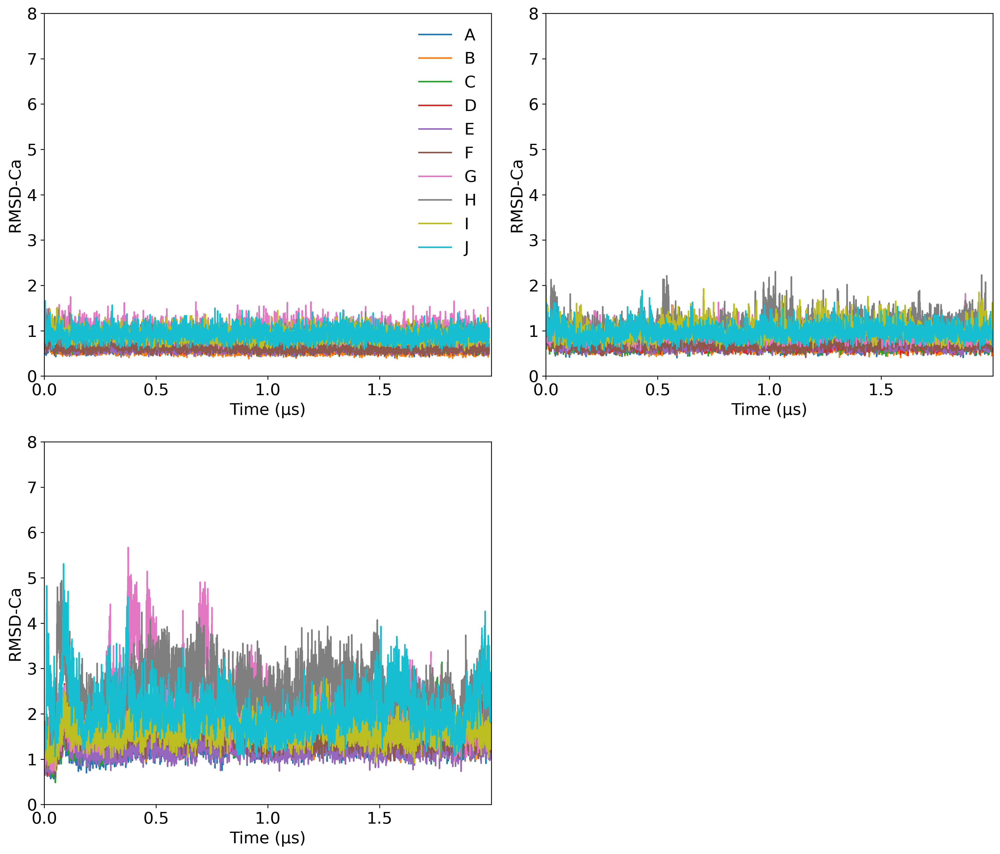

In [90]:
## Prog-RMSD MAvg

Mn_prmsd=bn.move_mean(Mn_rmsdp, window=10,axis=0)
Zn_prmsd=bn.move_mean(Zn_rmsdp, window=10,axis=0)
Mg_prmsd=bn.move_mean(Mg_rmsdp, window=10,axis=0)
Ca_prmsd=bn.move_mean(Ca_rmsdp, window=10,axis=0)

ca_pr2_rmsdp =bn.move_mean(ca_r2_rmsdp,  window=10,axis=0) 
mn_pFca_rmsdp=bn.move_mean(mn_Fca_rmsdp, window=10,axis=0)
mn_pFmg_rmsdp=bn.move_mean(mn_Fmg_rmsdp, window=10,axis=0)


plt.figure( figsize = (14,12))

# Per chain RMSD Ca 
#Mn
plt.subplot(221)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,3],label='A',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,4],label='B',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,5],label='C',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,6],label='D',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,7],label='E',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,8],label='F',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,9],label='G',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,10],label='H',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,11],label='I',rasterized=True)
plt.plot((Mn_prmsd[:,0]/10000),Mn_prmsd[:,12],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Zn
plt.subplot(222)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,3],label='A',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,4],label='B',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,5],label='C',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,6],label='D',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,7],label='E',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,8],label='F',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,9],label='G',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,10],label='H',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,11],label='I',rasterized=True)
plt.plot((Zn_prmsd[:,0]/10000),Zn_prmsd[:,12],label='J',rasterized=True)
##plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
##plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Mg
plt.subplot(223)
#plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,2],label='All',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,3],label='A',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,4],label='B',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,5],label='C',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,6],label='D',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,7],label='E',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,8],label='F',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,9],label='G',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,10],label='H',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,11],label='I',rasterized=True)
plt.plot((Mg_prmsd[:,0]/10000),Mg_prmsd[:,12],label='J',rasterized=True)
#plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 2.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 2, step=0.5))  # Set label locations.


plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSDprog_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

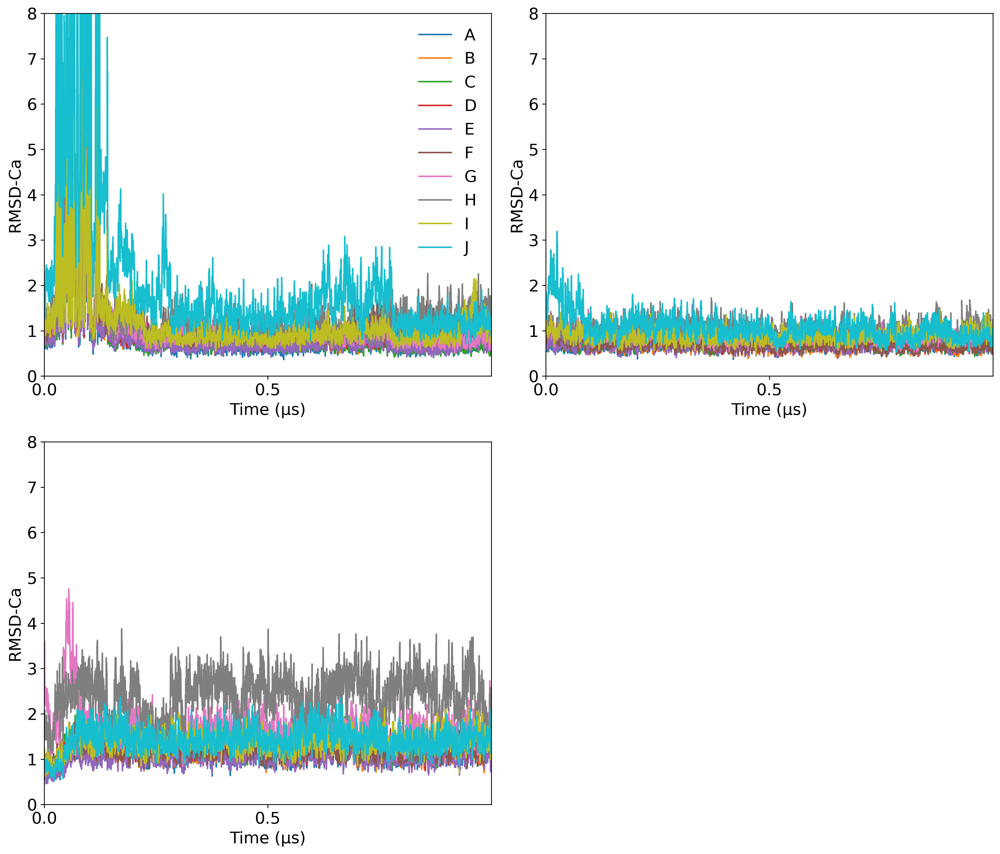

In [91]:
ca_pr2_rmsdp =bn.move_mean(ca_r2_rmsdp  ,window=10,axis=0) 
mn_pFca_rmsdp=bn.move_mean(mn_Fca_rmsdp ,window=10,axis=0)
mn_pFmg_rmsdp=bn.move_mean(mn_Fmg_rmsdp ,window=10,axis=0)


plt.figure( figsize = (14,12))

# Per chain RMSD Ca 
#Mn
plt.subplot(221)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,3],label='A',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,4],label='B',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,5],label='C',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,6],label='D',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,7],label='E',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,8],label='F',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,9],label='G',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,10],label='H',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,11],label='I',rasterized=True)
plt.plot((ca_pr2_rmsdp[:,0]/10000),ca_pr2_rmsdp[:,12],label='J',rasterized=True)
plt.legend(loc='best', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 1.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Zn
plt.subplot(222)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,3],label='A',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,4],label='B',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,5],label='C',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,6],label='D',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,7],label='E',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,8],label='F',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,9],label='G',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,10],label='H',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,11],label='I',rasterized=True)
plt.plot((mn_pFca_rmsdp[:,0]/10000),mn_pFca_rmsdp[:,12],label='J',rasterized=True)
##plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
##plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 1.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 1, step=0.5))  # Set label locations.
#locs, labels = yticks()  # Get the current locations and labels.
#yticks(np.arange(0, 16, step=5))  # Set label locations.

#Mg
plt.subplot(223)
#plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,2],label='All',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,3],label='A',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,4],label='B',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,5],label='C',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,6],label='D',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,7],label='E',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,8],label='F',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,9],label='G',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,10],label='H',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,11],label='I',rasterized=True)
plt.plot((mn_pFmg_rmsdp[:,0]/10000),mn_pFmg_rmsdp[:,12],label='J',rasterized=True)
#plt.legend(loc='upper left', frameon = False,)
plt.xlabel('Time (µs)')
plt.ylabel('RMSD-Ca')
#plt.title(str(fname))
plt.ylim([0, 8.0])
plt.xlim([0, 1.0])
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 1, step=0.5))  # Set label locations.

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/metal_zipper_sims_RMSDprog_cont_Nov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

### Tilt (angle between PAs of leaflets) ### 

#### Tilt and skew as in TF paper

#### TST 2D maps as in the TF paper ###

-The whole protein is centered on the origin.

-The upper leaflet (UL) (segname PROA PROA PROC PROE) is used as "reference" as it is more stable on all runs.

-The principal axes of the UL are alinged to the 3 cartesian axis as follows: PA1(0) --> Z; PA2(1) --> Y and PA3(2) --> X.

-Tilt is then the angle between the PAs normal to the leaflet (XY) plane and it reflects the angle bw both planes.

-Skew

-Twist

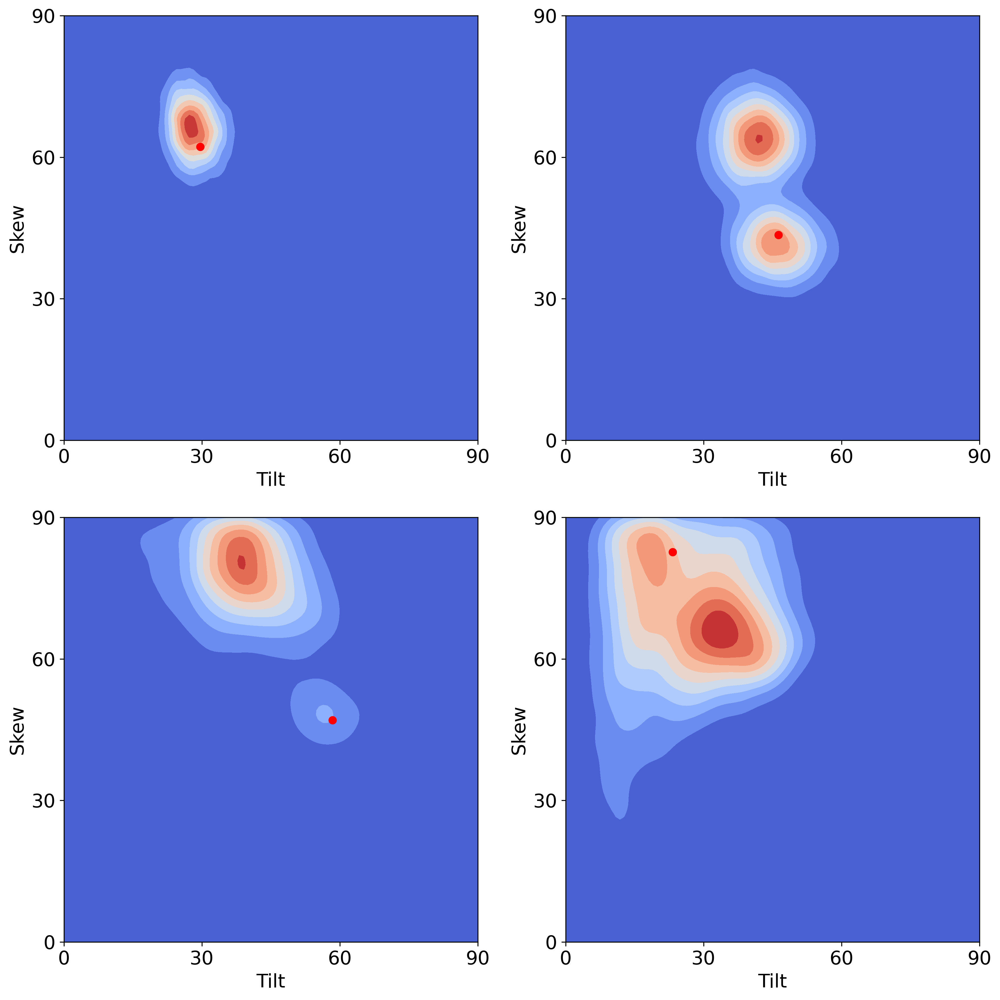

In [14]:
## 2D histograms of Tilt-Skew and Tilt-Twist using gaussian KDE. 
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st

fig = plt.figure(figsize=(12,12))

MN    =('/home/raul/projects/Amyloids/zipper/results/paxes/MNzip_TTS_original.dat')
ZN    =('/home/raul/projects/Amyloids/zipper/results/paxes/ZNzip_TTS_original.dat')
MG    =('/home/raul/projects/Amyloids/zipper/results/paxes/MGzip_TTS_original.dat')
CA    =('/home/raul/projects/Amyloids/zipper/results/paxes/CAzip_TTS_original.dat')

#tilt_MN =np.genfromtxt(MN, usecols=(10),autostrip=True, )
#skew_MN =np.genfromtxt(MN, usecols=(12),autostrip=True, )

tilt_MN =np.genfromtxt(MN, usecols=(10),autostrip=True,skip_header=5000 )
skew_MN =np.genfromtxt(MN, usecols=(12),autostrip=True,skip_header=5000)

tilt_MNc = np.array([180-x if x > 90 else x+0 for x in tilt_MN])
skew_MNc = np.array([180-x if x > 90 else x+0 for x in skew_MN])

#ZN

#tilt_ZN =np.genfromtxt(ZN, usecols=(6) ,autostrip=True, )
#skew_ZN =np.genfromtxt(ZN, usecols=(8) ,autostrip=True, )

tilt_ZN =np.genfromtxt(ZN, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_ZN =np.genfromtxt(ZN, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_ZNc = np.array([180-x if x > 90 else x+0 for x in tilt_ZN])
skew_ZNc = np.array([180-x if x > 90 else x+0 for x in skew_ZN])

#MG

#tilt_MG =np.genfromtxt(MG, usecols=(6) ,autostrip=True, )
#skew_MG =np.genfromtxt(MG, usecols=(8) ,autostrip=True, )

tilt_MG =np.genfromtxt(MG, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_MG =np.genfromtxt(MG, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_MGc = np.array([180-x if x > 90 else x+0 for x in tilt_MG])
skew_MGc = np.array([180-x if x > 90 else x+0 for x in skew_MG])

#CA 

#tilt_CA=np.genfromtxt(CA, usecols=(6) ,autostrip=True, )
#skew_CA=np.genfromtxt(CA, usecols=(8) ,autostrip=True, )

tilt_CA=np.genfromtxt(CA, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_CA=np.genfromtxt(CA, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_CAc = np.array([180-x if x > 90 else x+0 for x in tilt_CA])
skew_CAc = np.array([180-x if x > 90 else x+0 for x in skew_CA])



# normalize maps
norm1 = cm.colors.Normalize(vmax=0.00020)


# Extract x and y
x = tilt_MNc
y = skew_MNc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10

xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(221)
ax = fig.gca()
ax.plot(tilt_MNc[0], skew_MNc[0], "or")
ax.set_xlim(xmin, 90)
ax.set_ylim(ymin, 90)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.


### ZN ###
# Extract x and y
x = tilt_ZNc
y = skew_ZNc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(222)
ax = fig.gca()
ax.plot(tilt_ZNc[0], skew_ZNc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.

### MG ###

# Extract x and y
x = tilt_MGc
y = skew_MGc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)
ax = fig.add_subplot(223)
ax = fig.gca()
ax.plot(tilt_MGc[0], skew_MGc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.

### CA ###

# Extract x and y
x = tilt_CAc
y = skew_CAc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(224)
ax = fig.gca()
ax.plot(tilt_CAc[0], skew_CAc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.




plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/tilt_skew_init_2x2_mf500ns_2Dnov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()


In [47]:
tilt_MNf =np.genfromtxt(MN, usecols=(10),autostrip=True, )
skew_MNf =np.genfromtxt(MN, usecols=(12),autostrip=True, )

tilt_MN =np.genfromtxt(MN, usecols=(10),autostrip=True,skip_header=5000 )
skew_MN =np.genfromtxt(MN, usecols=(12),autostrip=True,skip_header=5000)

tilt_MNcf = np.array([180-x if x > 90 else x+0 for x in tilt_MNf])
skew_MNcf = np.array([180-x if x > 90 else x+0 for x in skew_MNf])
tilt_MNc = np.array([180-x if x > 90 else x+0 for x in tilt_MN])
skew_MNc = np.array([180-x if x > 90 else x+0 for x in skew_MN])

#ZN

tilt_ZNf =np.genfromtxt(ZN, usecols=(6) ,autostrip=True, )
skew_ZNf =np.genfromtxt(ZN, usecols=(8) ,autostrip=True, )

tilt_ZN =np.genfromtxt(ZN, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_ZN =np.genfromtxt(ZN, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_ZNcf = np.array([180-x if x > 90 else x+0 for x in tilt_ZNf])
skew_ZNcf = np.array([180-x if x > 90 else x+0 for x in skew_ZNf])

tilt_ZNc = np.array([180-x if x > 90 else x+0 for x in tilt_ZN])
skew_ZNc = np.array([180-x if x > 90 else x+0 for x in skew_ZN])

#MG

tilt_MGf =np.genfromtxt(MG, usecols=(6) ,autostrip=True, )
skew_MGf =np.genfromtxt(MG, usecols=(8) ,autostrip=True, )

tilt_MG =np.genfromtxt(MG, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_MG =np.genfromtxt(MG, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_MGcf = np.array([180-x if x > 90 else x+0 for x in tilt_MGf])
skew_MGcf = np.array([180-x if x > 90 else x+0 for x in skew_MGf])

tilt_MGc = np.array([180-x if x > 90 else x+0 for x in tilt_MG])
skew_MGc = np.array([180-x if x > 90 else x+0 for x in skew_MG])

#CA 

tilt_CAf=np.genfromtxt(CA, usecols=(6) ,autostrip=True, )
skew_CAf=np.genfromtxt(CA, usecols=(8) ,autostrip=True, )

tilt_CA=np.genfromtxt(CA, usecols=(6) ,autostrip=True,skip_header=5000 )
skew_CA=np.genfromtxt(CA, usecols=(8) ,autostrip=True,skip_header=5000 )

tilt_CAcf = np.array([180-x if x > 90 else x+0 for x in tilt_CAf])
skew_CAcf = np.array([180-x if x > 90 else x+0 for x in skew_CAf])

tilt_CAc = np.array([180-x if x > 90 else x+0 for x in tilt_CA])
skew_CAc = np.array([180-x if x > 90 else x+0 for x in skew_CA])

print ('tilt_MNcf=', np.round(np.mean(tilt_MNcf),decimals=1), '±',    np.round(np.std(tilt_MNcf),decimals=1))
print ('skew_MNcf=', np.round(np.mean(skew_MNcf),decimals=1), '±',    np.round(np.std(skew_MNcf),decimals=1))
print ('tilt_MNc =', np.round(np.mean(tilt_MNc ),decimals=1), '±',    np.round(np.std(tilt_MNc ),decimals=1))
print ('skew_MNc =', np.round(np.mean(skew_MNc ),decimals=1), '±',    np.round(np.std(skew_MNc ),decimals=1))

print ('tilt_ZNcf=', np.round(np.mean(tilt_ZNcf),decimals=1), '±',    np.round(np.std(tilt_ZNcf),decimals=1))
print ('skew_ZNcf=', np.round(np.mean(skew_ZNcf),decimals=1), '±',    np.round(np.std(skew_ZNcf),decimals=1))
print ('tilt_ZNc =', np.round(np.mean(tilt_ZNc ),decimals=1), '±',    np.round(np.std(tilt_ZNc ),decimals=1))
print ('skew_ZNc =', np.round(np.mean(skew_ZNc ),decimals=1), '±',    np.round(np.std(skew_ZNc ),decimals=1))

print ('tilt_MGcf=', np.round(np.mean(tilt_MGcf),decimals=1), '±',    np.round(np.std(tilt_MGcf),decimals=1))
print ('skew_MGcf=', np.round(np.mean(skew_MGcf),decimals=1), '±',    np.round(np.std(skew_MGcf),decimals=1))
print ('tilt_MGc =', np.round(np.mean(tilt_MGc ),decimals=1), '±',    np.round(np.std(tilt_MGc ),decimals=1))
print ('skew_MGc =', np.round(np.mean(skew_MGc ),decimals=1), '±',    np.round(np.std(skew_MGc ),decimals=1))

print ('tilt_CAcf=', np.round(np.mean(tilt_CAcf),decimals=1), '±',    np.round(np.std(tilt_CAcf),decimals=1))
print ('skew_CAcf=', np.round(np.mean(skew_CAcf),decimals=1), '±',    np.round(np.std(skew_CAcf),decimals=1))
print ('tilt_CAc =', np.round(np.mean(tilt_CAc ),decimals=1), '±',    np.round(np.std(tilt_CAc ),decimals=1))
print ('skew_CAc =', np.round(np.mean(skew_CAc ),decimals=1), '±',    np.round(np.std(skew_CAc ),decimals=1))


tilt_MNcf= 29.1 ± 4.8
skew_MNcf= 65.7 ± 6.5
tilt_MNc = 28.4 ± 3.9
skew_MNc = 66.2 ± 6.0
tilt_ZNcf= 42.3 ± 7.1
skew_ZNcf= 56.0 ± 12.8
tilt_ZNc = 43.3 ± 6.5
skew_ZNc = 54.5 ± 12.8
tilt_MGcf= 41.3 ± 12.6
skew_MGcf= 70.7 ± 13.9
tilt_MGc = 39.9 ± 11.7
skew_MGc = 73.1 ± 13.3
tilt_CAcf= 25.9 ± 12.0
skew_CAcf= 64.9 ± 17.3
tilt_CAc = 27.0 ± 11.8
skew_CAc = 66.9 ± 15.3


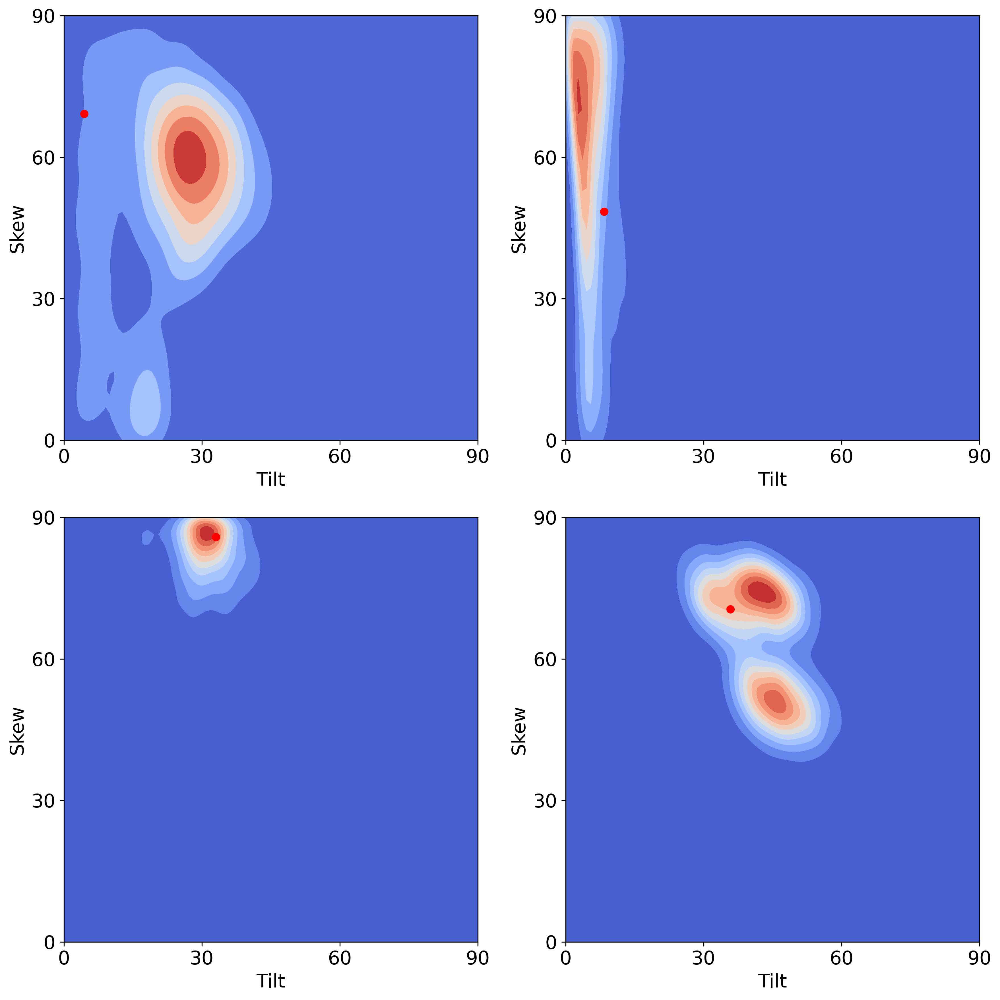

In [17]:
## 2D histograms of Tilt-Skew and Tilt-Twist using gaussian KDE. 
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st

fig = plt.figure(figsize=(12,12))


MNfMG =('/home/raul/projects/Amyloids/zipper/results/paxes/MNfMGzip_TTS_original.dat')
MNFCA =('/home/raul/projects/Amyloids/zipper/results/paxes/MNfCAzip_TTS_original.dat')
CAr2  =('/home/raul/projects/Amyloids/zipper/results/paxes/CAr2zip_TTS_original.dat')
CaFMn = ('/home/raul/projects/Amyloids/zipper/results/paxes/CafMnzip_TTS_original.dat')


#MNfMG

#tilt_MNfMG=np.genfromtxt(MNfMG, usecols=(6) ,autostrip=True)
#skew_MNfMG=np.genfromtxt(MNfMG, usecols=(8) ,autostrip=True)

tilt_MNfMG=np.genfromtxt(MNfMG, usecols=(6) ,autostrip=True, skip_header=5000)
skew_MNfMG=np.genfromtxt(MNfMG, usecols=(8) ,autostrip=True, skip_header=5000)


tilt_MNfMGc = np.array([180-x if x > 90 else x+0 for x in tilt_MNfMG])
skew_MNfMGc = np.array([180-x if x > 90 else x+0 for x in skew_MNfMG])

#MNFCA

#tilt_MNFCA=np.genfromtxt(MNFCA, usecols=(6) ,autostrip=True)
#skew_MNFCA=np.genfromtxt(MNFCA, usecols=(8) ,autostrip=True)

tilt_MNFCA=np.genfromtxt(MNFCA, usecols=(6) ,autostrip=True, skip_header=5000)
skew_MNFCA=np.genfromtxt(MNFCA, usecols=(8) ,autostrip=True, skip_header=5000)

tilt_MNFCAc = np.array([180-x if x > 90 else x+0 for x in tilt_MNFCA])
skew_MNFCAc = np.array([180-x if x > 90 else x+0 for x in skew_MNFCA])

#CAr2 

#tilt_CAr2=np.genfromtxt(CAr2, usecols=(6)  ,autostrip=True)
#skew_CAr2=np.genfromtxt(CAr2, usecols=(8)  ,autostrip=True)

tilt_CAr2=np.genfromtxt(CAr2, usecols=(6)  ,autostrip=True, skip_header=5000)
skew_CAr2=np.genfromtxt(CAr2, usecols=(8)  ,autostrip=True, skip_header=5000)

tilt_CAr2c =  np.array([180-x if x > 90 else x+0 for x in tilt_CAr2])
skew_CAr2c =  np.array([180-x if x > 90 else x+0 for x in skew_CAr2])

#Ca_F_Mn

#tilt_CaFMn=np.genfromtxt(CaFMn, usecols=(6)  ,autostrip=True)
#skew_CaFMn=np.genfromtxt(CaFMn, usecols=(8)  ,autostrip=True)

tilt_CaFMn=np.genfromtxt(CaFMn, usecols=(6)  ,autostrip=True, skip_header=5000)
skew_CaFMn=np.genfromtxt(CaFMn, usecols=(8)  ,autostrip=True, skip_header=5000)

tilt_CaFMnc =  np.array([180-x if x > 90 else x+0 for x in tilt_CaFMn])
skew_CaFMnc =  np.array([180-x if x > 90 else x+0 for x in skew_CaFMn])

# normalize maps
norm1 = cm.colors.Normalize(vmax=0.00020)

### MNfMG ###

# Extract x and y
x = tilt_MNfMGc
y = skew_MNfMGc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(223)
ax = fig.gca()
ax.plot(tilt_MNfMGc[0], skew_MNfMGc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')

ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.

### MNFCA ###

# Extract x and y
x = tilt_MNFCAc
y = skew_MNFCAc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10

xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(222)
ax = fig.gca()
ax.plot(tilt_MNFCAc[0], skew_MNFCAc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
#cset = ax.contour(xx, yy, f, colors='k')
#ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.+
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.

### CAr2  ###
# Extract x and y
x = tilt_CAr2c
y = skew_CAr2c
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)
ax = fig.add_subplot(221)
ax = fig.gca()
ax.plot(tilt_CAr2c[0], skew_CAr2c[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.

## Ca F Mn ##

# Extract x and y
x = tilt_CaFMnc
y = skew_CaFMnc
# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = 0
xmax = 90
ymin = 0
ymax = 90

# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)

ax = fig.add_subplot(224)
ax = fig.gca()
ax.plot(tilt_CaFMnc[0], skew_CaFMnc[0], "or")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
cfset = ax.contourf(xx, yy, f, levels=10, cmap='coolwarm')
ax.set_xlabel('Tilt')
ax.set_ylabel('Skew')
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0, 90.01, step=30))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 90.01, step=30))  # Set label locations.



plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/tilt_skew_cont_mf500ns_2Dnov2022.pdf',dpi=300, format = 'pdf')
#plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/tilt_skew_cont_full_2Dnov2022.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()


In [48]:
#MNfMG

tilt_MNfMGf=np.genfromtxt(MNfMG, usecols=(6) ,autostrip=True)
skew_MNfMGf=np.genfromtxt(MNfMG, usecols=(8) ,autostrip=True)

tilt_MNfMG=np.genfromtxt(MNfMG, usecols=(6) ,autostrip=True, skip_header=5000)
skew_MNfMG=np.genfromtxt(MNfMG, usecols=(8) ,autostrip=True, skip_header=5000)

tilt_MNfMGcf = np.array([180-x if x > 90 else x+0 for x in tilt_MNfMGf])
skew_MNfMGcf = np.array([180-x if x > 90 else x+0 for x in skew_MNfMGf])

tilt_MNfMGc = np.array([180-x if x > 90 else x+0 for x in tilt_MNfMG])
skew_MNfMGc = np.array([180-x if x > 90 else x+0 for x in skew_MNfMG])

#MNFCA

tilt_MNFCAf=np.genfromtxt(MNFCA, usecols=(6) ,autostrip=True)
skew_MNFCAf=np.genfromtxt(MNFCA, usecols=(8) ,autostrip=True)

tilt_MNFCA=np.genfromtxt(MNFCA, usecols=(6) ,autostrip=True, skip_header=5000)
skew_MNFCA=np.genfromtxt(MNFCA, usecols=(8) ,autostrip=True, skip_header=5000)

tilt_MNFCAcf = np.array([180-x if x > 90 else x+0 for x in tilt_MNFCAf])
skew_MNFCAcf = np.array([180-x if x > 90 else x+0 for x in skew_MNFCAf])

tilt_MNFCAc = np.array([180-x if x > 90 else x+0 for x in tilt_MNFCA])
skew_MNFCAc = np.array([180-x if x > 90 else x+0 for x in skew_MNFCA])

#CAr2 

tilt_CAr2f=np.genfromtxt(CAr2, usecols=(6)  ,autostrip=True)
skew_CAr2f=np.genfromtxt(CAr2, usecols=(8)  ,autostrip=True)

tilt_CAr2=np.genfromtxt(CAr2, usecols=(6)  ,autostrip=True, skip_header=5000)
skew_CAr2=np.genfromtxt(CAr2, usecols=(8)  ,autostrip=True, skip_header=5000)

tilt_CAr2cf =  np.array([180-x if x > 90 else x+0 for x in tilt_CAr2f])
skew_CAr2cf =  np.array([180-x if x > 90 else x+0 for x in skew_CAr2f])

tilt_CAr2c =  np.array([180-x if x > 90 else x+0 for x in tilt_CAr2])
skew_CAr2c =  np.array([180-x if x > 90 else x+0 for x in skew_CAr2])

#Ca_F_Mn

tilt_CaFMnf=np.genfromtxt(CaFMn, usecols=(6)  ,autostrip=True)
skew_CaFMnf=np.genfromtxt(CaFMn, usecols=(8)  ,autostrip=True)

tilt_CaFMn=np.genfromtxt(CaFMn, usecols=(6)  ,autostrip=True, skip_header=5000)
skew_CaFMn=np.genfromtxt(CaFMn, usecols=(8)  ,autostrip=True, skip_header=5000)

tilt_CaFMncf =  np.array([180-x if x > 90 else x+0 for x in tilt_CaFMnf])
skew_CaFMncf =  np.array([180-x if x > 90 else x+0 for x in skew_CaFMnf])

tilt_CaFMnc =  np.array([180-x if x > 90 else x+0 for x in tilt_CaFMn])
skew_CaFMnc =  np.array([180-x if x > 90 else x+0 for x in skew_CaFMn])

print ('tilt_MNfMGcf=', np.round(np.mean(tilt_MNfMGcf),decimals=1), '±',    np.round(np.std(tilt_MNfMGcf),decimals=1))
print ('skew_MNfMGcf=', np.round(np.mean(skew_MNfMGcf),decimals=1), '±',    np.round(np.std(skew_MNfMGcf),decimals=1))
print ('tilt_MNfMGc =', np.round(np.mean(tilt_MNfMGc ),decimals=1), '±',    np.round(np.std(tilt_MNfMGc ),decimals=1))
print ('skew_MNfMGc =', np.round(np.mean(skew_MNfMGc ),decimals=1), '±',    np.round(np.std(skew_MNfMGc ),decimals=1))

print ('tilt_MNFCAcf=', np.round(np.mean(tilt_MNFCAcf),decimals=1), '±',    np.round(np.std(tilt_MNFCAcf),decimals=1))
print ('skew_MNFCAcf=', np.round(np.mean(skew_MNFCAcf),decimals=1), '±',    np.round(np.std(skew_MNFCAcf),decimals=1))
print ('tilt_MNFCAc =', np.round(np.mean(tilt_MNFCAc ),decimals=1), '±',    np.round(np.std(tilt_MNFCAc ),decimals=1))
print ('skew_MNFCAc =', np.round(np.mean(skew_MNFCAc ),decimals=1), '±',    np.round(np.std(skew_MNFCAc ),decimals=1))

print ('tilt_CAr2cf=', np.round(np.mean(tilt_CAr2cf),decimals=1), '±',    np.round(np.std(tilt_CAr2cf),decimals=1))
print ('skew_CAr2cf=', np.round(np.mean(skew_CAr2cf),decimals=1), '±',    np.round(np.std(skew_CAr2cf),decimals=1))
print ('tilt_CAr2c =', np.round(np.mean(tilt_CAr2c ),decimals=1), '±',    np.round(np.std(tilt_CAr2c ),decimals=1))
print ('skew_CAr2c =', np.round(np.mean(skew_CAr2c ),decimals=1), '±',    np.round(np.std(skew_CAr2c ),decimals=1))

print ('tilt_CaFMncf=', np.round(np.mean(tilt_CaFMncf),decimals=1), '±',    np.round(np.std(tilt_CaFMncf),decimals=1))
print ('skew_CaFMncf=', np.round(np.mean(skew_CaFMncf),decimals=1), '±',    np.round(np.std(skew_CaFMncf),decimals=1))
print ('tilt_CaFMnc =', np.round(np.mean(tilt_CaFMnc ),decimals=1), '±',    np.round(np.std(tilt_CaFMnc ),decimals=1))
print ('skew_CaFMnc =', np.round(np.mean(skew_CaFMnc ),decimals=1), '±',    np.round(np.std(skew_CaFMnc ),decimals=1))


tilt_MNfMGcf= 31.2 ± 7.1
skew_MNfMGcf= 81.0 ± 7.5
tilt_MNfMGc = 30.6 ± 6.2
skew_MNfMGc = 81.5 ± 7.0
tilt_MNFCAcf= 8.7 ± 7.7
skew_MNFCAcf= 56.8 ± 23.3
tilt_MNFCAc = 6.1 ± 3.7
skew_MNFCAc = 57.3 ± 24.5
tilt_CAr2cf= 18.8 ± 10.7
skew_CAr2cf= 49.4 ± 22.9
tilt_CAr2c = 23.1 ± 10.4
skew_CAr2c = 51.7 ± 20.4
tilt_CaFMncf= 40.0 ± 7.4
skew_CaFMncf= 65.1 ± 10.9
tilt_CaFMnc = 42.7 ± 7.4
skew_CaFMnc = 63.6 ± 11.9


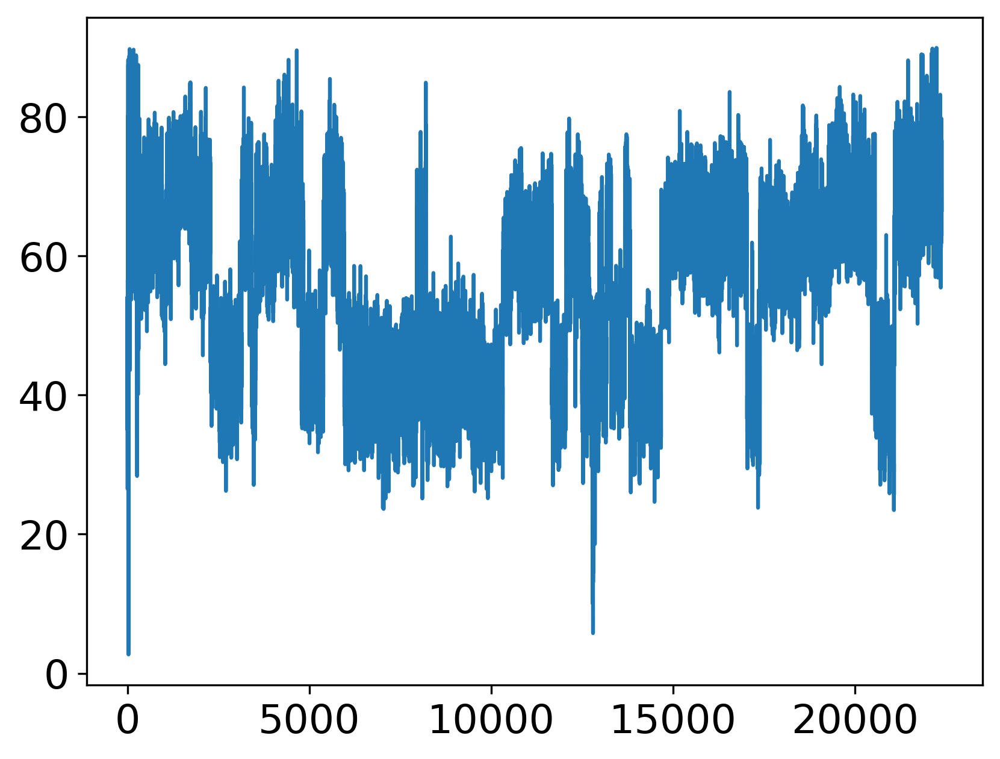

In [83]:
plt.plot(skew_ZNc)

[ 71.94236926 -20.58083745   4.32074128 ... -34.30412236 -26.02993677
 -26.02993914]


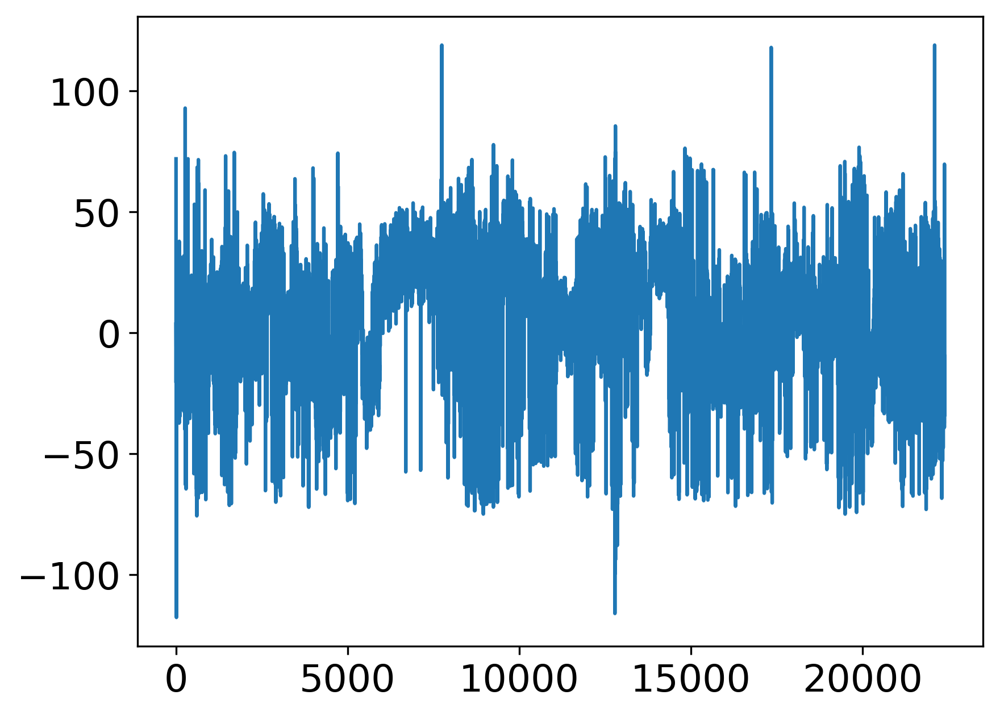

In [82]:
twist_ZNb=np.genfromtxt(ZN, usecols=(12),autostrip=True)
twist_ZNbcc = np.array([-180-x if x < -60 else  x+0 for x in twist_ZNb])
twist_ZNbc = np.array([180-x if x > 60 else  x+0 for x in twist_ZNbcc])

#print (twist_MNb)
print (twist_ZNbc)

plt.plot(twist_ZNbc)
#plt.plot(twist_MNb)


## Asp2 - Asp 4 distance (intramonomer)

In [43]:
### Files
MNBdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MNprod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)           
MNAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MNprod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

ZNBdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/ZNprod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
ZNAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/ZNprod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

MGBdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MGprod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
MGAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MGprod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

CABdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CAprod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
CAAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CAprod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

CAR2Adist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CAR2prod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
CAR2Bdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CAR2prod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

MNfCAAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MN_from_CA_prod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
MNfCABdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MN_from_CA_prod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

MNfMGBdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MN_from_MG_prod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
MNfMGAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/MN_from_MG_prod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)

CafMnBdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CA_from_MN_prod_leafB_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)
CafMnAdist_D2_D4=np.loadtxt('/home/raul/projects/Amyloids/zipper/results/dist/CA_from_MN_prod_leafA_D2_D4_intra.dat', usecols=(1,2,3,4,5),skiprows=5000)


MNdist=np.concatenate ((MNBdist_D2_D4, MNAdist_D2_D4), axis=0)
MNdist2=MNdist.flatten()

ZNdist=np.concatenate ((ZNBdist_D2_D4, ZNAdist_D2_D4), axis=0)
ZNdist2=ZNdist.flatten()

MGdist=np.concatenate ((MGBdist_D2_D4, MGAdist_D2_D4), axis=0)
MGdist2=MGdist.flatten()

CAdist=np.concatenate ((CABdist_D2_D4, CAAdist_D2_D4), axis=0)
CAdist2=CAdist.flatten()

CAR2dist=np.concatenate ((CAR2Bdist_D2_D4, CAR2Adist_D2_D4), axis=0)
CAR2dist2=CAdist.flatten()

MNfCAdist=np.concatenate ((MNfCABdist_D2_D4, MNfCAAdist_D2_D4), axis=0)
MNfCAdist2=MNfCAdist.flatten()

MNfMGdist=np.concatenate ((MNfMGBdist_D2_D4, MNfMGAdist_D2_D4), axis=0)
MNfMGdist2=MNfMGdist.flatten()

CafMnBdist=np.concatenate ((CafMnBdist_D2_D4,CafMnAdist_D2_D4), axis=0)
CafMnBdist2=CafMnBdist.flatten()

#print (CABdist_D2_D4)

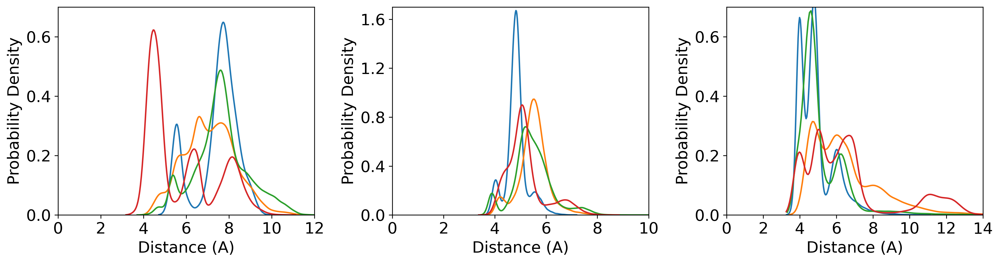

In [94]:
fig = plt.figure(figsize=(14.4,4))

#sns.histplot((MNdist[:,0]), stat='density',bins=20,kde=True, color='orange',line_kws=dict(color="orange", linewidth=2), edgecolor="None",label='CLpcps_r1')
#sns.histplot((MNdist[:,1]), stat='density',bins=20,kde=True, color='orange',line_kws=dict(color="orange", linewidth=2), edgecolor="None",label='CLpcps_r1')
#sns.histplot((MNdist[:,2]), stat='density',bins=20,kde=True, color='orange',line_kws=dict(color="orange", linewidth=2), edgecolor="None",label='CLpcps_r1')

ax=plt.subplot(131)
ax=sns.histplot(data=MNdist2,stat='density',discrete=False, kde=True, color='tab:blue',label='Mn$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=ZNdist2,stat='density',discrete=False, kde=True, color='tab:orange',label='Zn$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=MGdist2,stat='density',discrete=False, kde=True, color='tab:green',label='Mg$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=CAdist2,stat='density',discrete=False, kde=True, color='tab:red',label='Ca$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax.set_xlabel('Distance (A)')
ax.set_ylabel('Probability Density')
ax.set_xlim(0, 12.0)
ax.set_ylim(0, 0.7)
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0.0, 12.1, step=2))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 0.71, step=0.2))  # Set label locations.
#ax.legend(loc='upper left', frameon = False)

ax2=plt.subplot(132)
ax2=sns.histplot(data=MNdist442,stat='density',discrete=False, kde=True, color='tab:blue',label='Mn$^{2+}$',lw=1.5)
ax2.containers[0].remove() 
ax2=sns.histplot(data=ZNdist442,stat='density',discrete=False, kde=True, color='tab:orange',label='Zn$^{2+}$',lw=1.5)
ax2.containers[0].remove() 
ax2=sns.histplot(data=MGdist442,stat='density',discrete=False, kde=True, color='tab:green',label='Mg$^{2+}$',lw=1.5)
ax2.containers[0].remove() 
ax2=sns.histplot(data=CAdist442,stat='density',discrete=False, kde=True, color='tab:red',label='Ca$^{2+}$',lw=1.5)
ax2.containers[0].remove() 
ax2.set_xlabel('Distance (A)')
ax2.set_ylabel('Probability Density')
ax2.set_xlim(0, 10.0)
ax2.set_ylim(0, 1.7)
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0.0, 10.1, step=2))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 1.71, step=0.4))  # Set label locations.
#ax.legend(loc='upper left', frameon = False)

ax3=plt.subplot(133)
ax3=sns.histplot(data=MNdist222,stat='density',discrete=False, kde=True, color='tab:blue',label='Mn$^{2+}$',lw=1.5)
ax3.containers[0].remove() 
ax3=sns.histplot(data=ZNdist222,stat='density',discrete=False, kde=True, color='tab:orange',label='Zn$^{2+}$',lw=1.5)
ax3.containers[0].remove() 
ax3=sns.histplot(data=MGdist222,stat='density',discrete=False, kde=True, color='tab:green',label='Mg$^{2+}$',lw=1.5)
ax3.containers[0].remove() 
ax3=sns.histplot(data=CAdist222,stat='density',discrete=False, kde=True, color='tab:red',label='Ca$^{2+}$',lw=1.5)
ax3.containers[0].remove() 
ax3.set_xlabel('Distance (A)')
ax3.set_ylabel('Probability Density')
ax3.set_xlim(0, 14.0)
ax3.set_ylim(0, 0.7)
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0.0, 14.1, step=2))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 0.71, step=0.2))  # Set label locations.
#ax.legend(loc='upper left', frameon = False)

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/DD_dist_intra_inter_initial_runs_nov2022_minus500ns.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

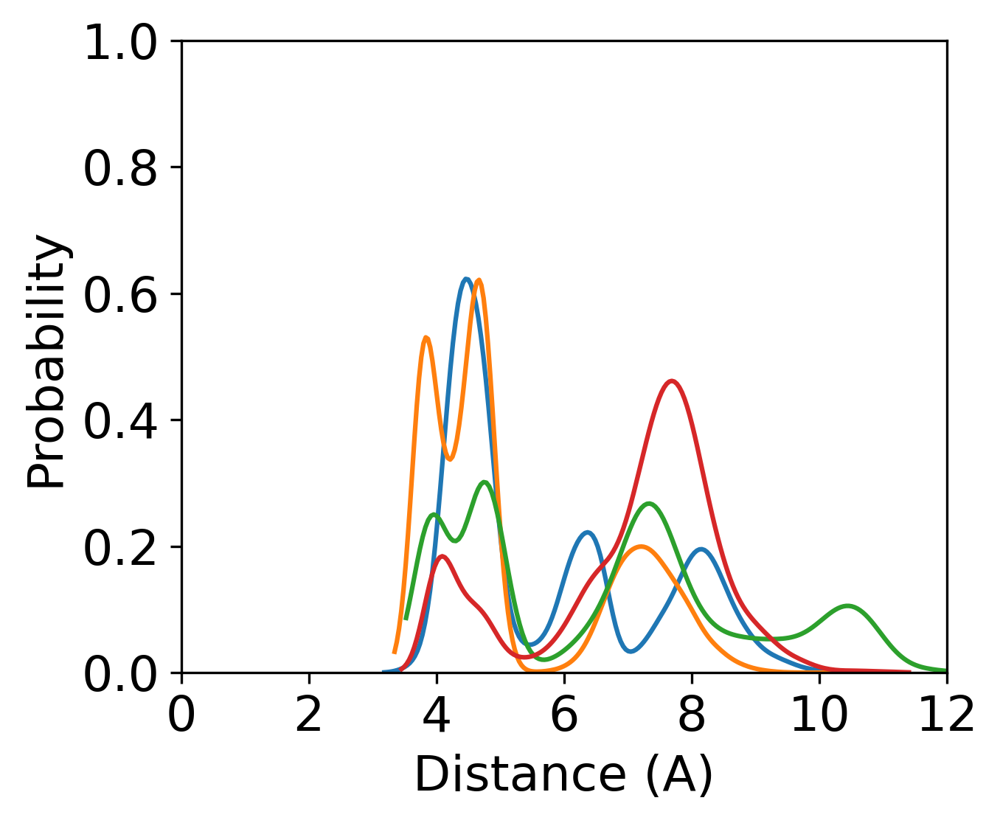

In [24]:
fig = plt.figure(figsize=(4.8,4))


ax=sns.histplot(data=CAR2dist2,stat='probability',discrete=True, kde=True, color='tab:blue',label='Ca$^{2+}$ R2',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=MNfCAdist2,stat='probability',discrete=True, kde=True, color='tab:orange',label='Mn$^{2+}$ from Ca$^{2+}$ ',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=MNfMGdist2,stat='probability',discrete=True, kde=True, color='tab:green',label='Mn$^{2+}$ from Mg$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax=sns.histplot(data=CafMnBdist2,stat='probability',discrete=True, kde=True, color='tab:red',label='Ca$^{2+}$ from Mn$^{2+}$',lw=1.5)
ax.containers[0].remove() 
ax.set_xlabel('Distance (A)')
ax.set_ylabel('Probability')
ax.set_xlim(0, 12.0)
ax.set_ylim(0, 1.0)
locs, labels = xticks()  # Get the current locations and labels.
xticks(np.arange(0.0, 12.1, step=2))  # Set label locations.
locs, labels = yticks()  # Get the current locations and labels.
yticks(np.arange(0, 1.01, step=0.2))  # Set label locations.
#ax.legend(loc='upper left', frameon = False)

plt.savefig('/home/raul/projects/Amyloids/zipper/results/images_figures/D2_D4_dist_cont_runs_nov2022_minus500us.pdf',dpi=300, format = 'pdf')
plt.tight_layout() 
plt.show()

In [42]:
print ('Mn_dist=', np.round(np.mean(MNdist2),decimals=1), '±',    np.round(np.std(MNdist2),decimals=1))
print ('Zn_dist=', np.round(np.mean(ZNdist2),decimals=1), '±',    np.round(np.std(ZNdist2),decimals=1))
print ('Mg_dist=', np.round(np.mean(MGdist2),decimals=1), '±',    np.round(np.std(MGdist2),decimals=1))
print ('Ca_dist=', np.round(np.mean(CAdist2),decimals=1), '±',    np.round(np.std(CAdist2),decimals=1))
print ('CaR2_dist=', np.round(np.mean(CAR2dist),decimals=1), '±',   np.round(np.std(CAR2dist),decimals=1))
print ('Mn_f_Ca_dist=', np.round(np.mean(MNfCAdist2),decimals=1), '±', np.round(np.std(MNfCAdist2),decimals=1))
print ('Mn_f_Mg_dist=', np.round(np.mean(MNfMGdist2),decimals=1), '±', np.round(np.std(MNfMGdist2),decimals=1))
print ('Ca_f_Mn_dist=', np.round(np.mean(CafMnBdist2),decimals=1), '±',np.round(np.std(CafMnBdist2),decimals=1))






Mn_dist= 7.4 ± 1.0
Zn_dist= 7.1 ± 1.2
Mg_dist= 7.6 ± 1.3
Ca_dist= 5.6 ± 1.6
CaR2_dist= 6.0 ± 1.8
Mn_f_Ca_dist= 5.2 ± 1.5
Mn_f_Mg_dist= 6.6 ± 2.2
Ca_f_Mn_dist= 7.0 ± 1.5


In [25]:
def blockAverage(datastream, isplot=True, maxBlockSize=0):
 
	Nobs         = len(datastream)           # total number of observations in datastream
	minBlockSize = 1;                        # min: 1 observation/block
 
	if maxBlockSize == 0:
		maxBlockSize = int(Nobs/4);        # max: 4 blocs (otherwise can't calc variance)
  
	NumBlocks = maxBlockSize - minBlockSize   # total number of block sizes

	blockMean = np.zeros(NumBlocks)               # mean (expect to be "nearly" constant)
	blockVar  = np.zeros(NumBlocks)               # variance associated with each blockSize
	blockCtr  = 0
	
				#
				#  blockSize is # observations/block
				#  run them through all the possibilities
				#
 
	for blockSize in range(minBlockSize, maxBlockSize):

		Nblock    = int(Nobs/blockSize)               # total number of such blocks in datastream
		obsProp   = np.zeros(Nblock)                  # container for parcelling block 
        
		# Loop to chop datastream into blocks
		# and take average
		for i in range(1,Nblock+1):
			
			ibeg = (i-1) * blockSize
			iend =  ibeg + blockSize
			obsProp[i-1] = np.mean(datastream[ibeg:iend])

		blockMean[blockCtr] = np.mean(obsProp)
		blockVar[blockCtr]  = np.var(obsProp)/(Nblock - 1)
		blockCtr += 1
 
	v = np.arange(minBlockSize,maxBlockSize)
	
	if isplot:
    
		plt.figure( figsize = (6,3)) 
		plt.subplot(1,2,1)
		plt.plot(v, np.sqrt(blockVar),'-',lw=1)
		plt.xlabel('block size')
		plt.ylabel('std')

		plt.subplot(1,2,2)
		plt.errorbar(v, blockMean, np.sqrt(blockVar))
		plt.ylabel('<x>')
		plt.xlabel('block size')

		print (blockMean[-1], np.sqrt(blockVar[-1]))
        
		plt.tight_layout()
		plt.show()
		
	#return v, blockVar, blockMean

MN2_minus_500ns
7.416052387049824 0.08702201881059769


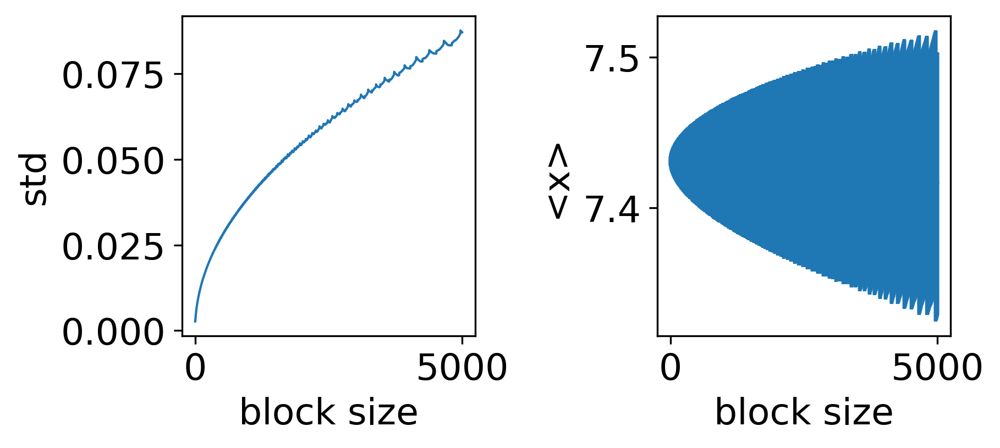

ZN2_minus_500ns
7.079045078262713 0.09755012516851906


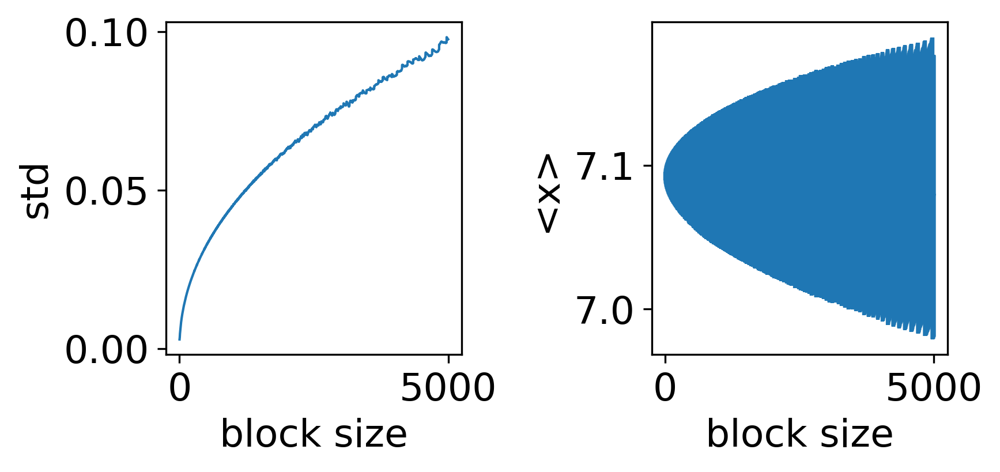

MG2_minus_500ns
7.62004217795172 0.0766300435603374


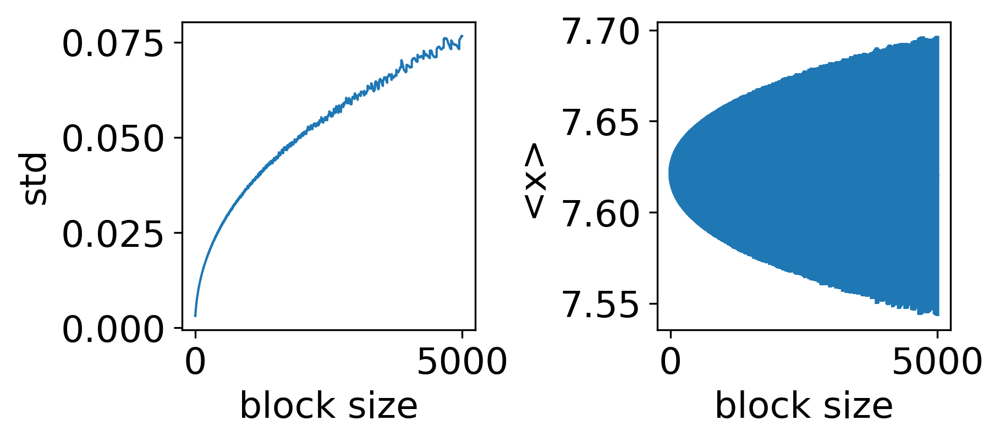

CA2_minus_500ns
5.792239481484297 0.05929123231463906


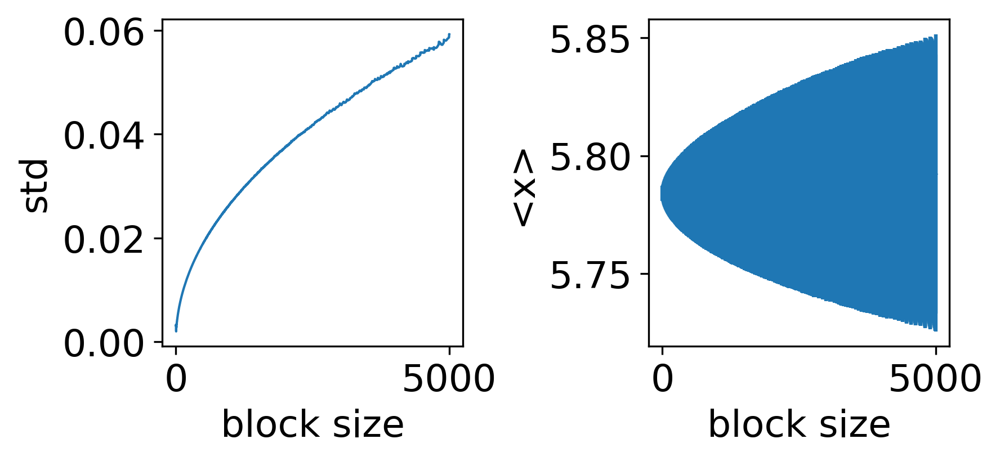

In [208]:
## Block analysis 


print ('MN2_minus_500ns')
blockAverage((MNdist2),maxBlockSize=5000)

print ('ZN2_minus_500ns')
blockAverage((ZNdist2),maxBlockSize=5000)

print ('MG2_minus_500ns')
blockAverage((MGdist2),maxBlockSize=5000)

print ('CA2_minus_500ns')
blockAverage((CAdist2),maxBlockSize=5000)
